In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import re

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Loading data

In [5]:
rootPath = os.getcwd()
os.makedirs('data', exist_ok=True)

folder = 'data'
filePath = os.path.join(rootPath, folder)

fileFeatures = os.path.join(filePath, 'dengue_features_train.csv')
fileLabels = os.path.join(filePath, 'dengue_labels_train.csv')

X = pd.read_csv(os.path.join(filePath, fileFeatures))
y = pd.read_csv(os.path.join(filePath, fileLabels))

print(f"Data dimensions: X: {X.shape}, y: {y.shape}")


Data dimensions: X: (1456, 24), y: (1456, 4)


##

In [6]:
# Join X and y for easy access
df = X.merge(y, on=['city', 'year', 'weekofyear'], how='left')


In [7]:
# change
df['week_start_date'] = pd.to_datetime(df['week_start_date'])

In [8]:
# Checking number of observations
obs = df[['city', 'year']].groupby(['city', 'year']).size().reset_index(name='n')
city_obs = obs.loc[:,['city','n']].groupby('city').agg('sum').reset_index()
city_obs

,city,n
0,iq,520
1,sj,936


In [9]:
# Checking date range
print(f"San Juan: {df.loc[df['city']=='sj','year'].unique()}")
print(f"Iquitos : {df.loc[df['city']=='iq','year'].unique()}")

San Juan: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008]
Iquitos : [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010]


In [10]:
city_obs['n'].sum()

1456

### Checking Missing values

In [11]:
print(f"Number of variables with missing instances: {sum(df.isna().any())}")

Number of variables with missing instances: 20


In [12]:
z = df.isna().any()
z = z.loc[lambda x: x == True]
with_missing = list(z.index)

# count missing instances for each feature
missingCounts = {}
for c in with_missing:
    missingCounts[c] = sum(X[c].isna())

# print(f"{c} : {sum(X[c].isna())}")
missingCounts

{'ndvi_ne': 194,
 'ndvi_nw': 52,
 'ndvi_se': 22,
 'ndvi_sw': 22,
 'precipitation_amt_mm': 13,
 'reanalysis_air_temp_k': 10,
 'reanalysis_avg_temp_k': 10,
 'reanalysis_dew_point_temp_k': 10,
 'reanalysis_max_air_temp_k': 10,
 'reanalysis_min_air_temp_k': 10,
 'reanalysis_precip_amt_kg_per_m2': 10,
 'reanalysis_relative_humidity_percent': 10,
 'reanalysis_sat_precip_amt_mm': 13,
 'reanalysis_specific_humidity_g_per_kg': 10,
 'reanalysis_tdtr_k': 10,
 'station_avg_temp_c': 43,
 'station_diur_temp_rng_c': 43,
 'station_max_temp_c': 20,
 'station_min_temp_c': 14,
 'station_precip_mm': 22}

In [13]:
with_missing

['ndvi_ne',
 'ndvi_nw',
 'ndvi_se',
 'ndvi_sw',
 'precipitation_amt_mm',
 'reanalysis_air_temp_k',
 'reanalysis_avg_temp_k',
 'reanalysis_dew_point_temp_k',
 'reanalysis_max_air_temp_k',
 'reanalysis_min_air_temp_k',
 'reanalysis_precip_amt_kg_per_m2',
 'reanalysis_relative_humidity_percent',
 'reanalysis_sat_precip_amt_mm',
 'reanalysis_specific_humidity_g_per_kg',
 'reanalysis_tdtr_k',
 'station_avg_temp_c',
 'station_diur_temp_rng_c',
 'station_max_temp_c',
 'station_min_temp_c',
 'station_precip_mm']

In [14]:
# drop rows with all missing features
df_allmiss = df[df[with_missing].isna().all(axis=1)]
df_allmiss
df.dropna(axis=0, how='all', subset=with_missing, inplace=True)


In [15]:
df.isna().sum(axis=0)

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  189
ndvi_nw                                   47
ndvi_se                                   17
ndvi_sw                                   17
precipitation_amt_mm                       8
reanalysis_air_temp_k                      5
reanalysis_avg_temp_k                      5
reanalysis_dew_point_temp_k                5
reanalysis_max_air_temp_k                  5
reanalysis_min_air_temp_k                  5
reanalysis_precip_amt_kg_per_m2            5
reanalysis_relative_humidity_percent       5
reanalysis_sat_precip_amt_mm               8
reanalysis_specific_humidity_g_per_kg      5
reanalysis_tdtr_k                          5
station_avg_temp_c                        38
station_diur_temp_rng_c                   38
station_max_temp_c                        15
station_mi

In [16]:
# get rows with too many missing values
df[df.isnull().sum(axis=1)>10]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
87,sj,1992,1,1992-01-01,0.125100,0.157867,0.185283,0.181367,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
399,sj,1998,1,1998-01-01,0.045500,0.047800,0.123986,0.083443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64
711,sj,2004,1,2004-01-01,-0.268300,-0.123700,0.223757,0.176543,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15
1118,iq,2004,1,2004-01-01,0.202571,0.198967,0.244557,0.187957,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
1378,iq,2009,1,2009-01-01,0.151286,0.161686,0.153271,0.119443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [17]:

# Drop these rows too
df = df[df.isnull().sum(axis=1)<10]

In [18]:
# checking mising values once again
# The remaining missing will then be imputed
df[df.isnull().any(axis=1)]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
5,sj,1990,23,1990-06-04,NaN,0.174850,0.254314,0.181743,9.58,299.630000,...,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1,2
9,sj,1990,27,1990-07-02,NaN,0.121550,0.160683,0.202567,14.41,300.154286,...,81.281429,14.41,18.071429,2.014286,28.328571,6.514286,33.9,24.4,1.1,6
13,sj,1990,31,1990-07-30,NaN,0.247150,0.379700,0.381357,32.66,299.862857,...,80.584286,32.66,17.594286,2.585714,28.242857,8.085714,34.4,22.8,37.6,17
14,sj,1990,32,1990-08-06,NaN,0.064333,0.164443,0.138857,28.80,300.391429,...,79.650000,28.80,17.950000,2.328571,28.200000,7.557143,33.3,23.3,11.4,23
15,sj,1990,33,1990-08-13,NaN,0.128033,0.206957,0.168243,90.75,299.958571,...,84.178571,90.75,18.515714,1.857143,28.042857,6.685714,32.8,22.8,44.7,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365,iq,2008,40,2008-09-30,0.393086,0.378271,0.343700,0.404843,24.28,299.178571,...,79.502857,24.28,16.331429,12.785714,NaN,NaN,36.0,19.6,1.0,45
1400,iq,2009,23,2009-06-04,0.114000,0.092443,0.097471,0.126286,42.22,296.125714,...,95.507143,42.22,16.757143,6.071429,28.100000,11.800000,34.0,22.2,NaN,3
1409,iq,2009,32,2009-08-06,0.395000,0.352733,0.484286,0.401914,9.79,297.370000,...,87.811429,9.79,16.337143,11.757143,27.975000,12.100000,35.4,20.5,NaN,5
1431,iq,2010,1,2010-01-08,0.124571,0.179129,0.163843,0.135471,27.04,299.264286,...,78.271429,27.04,16.127143,11.100000,28.600000,12.300000,35.1,21.8,NaN,10


# Train-test split
- data is time series, we take a future set instead of random split
- Roughly 2 percent of data is used as test set for each city. Iq 2 years, Sj 3 years

In [19]:
# Train set
df_train_iq = df[(df['city']=='iq') & (~df['year'].isin([2009, 2010]))]
df_train_sj = df[(df['city']=='sj') & (~df['year'].isin([2006, 2007, 2008]))]
df_train = pd.concat((df_train_iq,df_train_sj), axis=0)

# Test set
df_test_iq = df[(df['city']=='iq') & (df['year'].isin([2009, 2010]))]
df_test_sj = df[(df['city']=='sj') & (df['year'].isin([2006, 2007, 2008]))]
df_test = pd.concat((df_test_iq,df_test_sj), axis=0)


# Exploratory Data Analysis

# Missing value imputation
- Missing values are replaced by median values in corresponding year of each city
- Robust to outliers
- Done separately for the training set and test set to avoid data leakage
- EDA is based on training set

In [20]:
# # Making it compatible with Pipelines
# from sklearn.base import BaseEstimator, TransformerMixin

# class MissingValueImputer(BaseEstimator, TransformerMixin):
#     def __init__(self, features):
#         self.features = features

#     def fit(self, X, y=None):
#         return self

#     def transform(self, X):
#         X_copy = X.copy()
#         for f in self.features:
#             X_copy.loc[:, f] = X_copy.groupby(['city', 'weekofyear'])[f].transform(lambda x: x.fillna(x.median()))
#         return X_copy.reset_index()

# # Example usage:
# imputer = MissingValueImputer(features=with_missing)
# df_train = imputer.transform(df_train).drop('index', axis=1)
# df_test = imputer.transform(df_test).drop('index', axis=1)

def replace_missing(df):
    exclude = ['year', 'week_start_date', 'total_cases']
    features = [c for c in df.columns if c not in exclude]
    median_variables = ['med_'+c for c in features if c not in ['city', 'weekofyear']]

    df_med = df[features].groupby(['city', 'weekofyear']).agg('median').reset_index()

    # Rename median columns
    df_med.columns = ['city', 'weekofyear']+ median_variables
    df1 = df.merge(df_med, how='left',on=['city', 'weekofyear'])

    for f in features:
        if df[f].isna().any():
            # replace missing values by median of the corresponding week of the city
            df1.loc[:,f] = df1[f].fillna(df1['med_'+f])
            # If no median is found, replace by preceding week values
            df1.loc[:,f] = df1.groupby('city')[f].ffill().reset_index()
    df1.reset_index(drop=True, inplace=True)
    df1 = df1.loc[:,~df1.columns.str.startswith('med_')]

    return df1

# Replace missing values
df_train = replace_missing(df_train)
df_test = replace_missing(df_test)

In [21]:
type(df_train)

pandas.core.frame.DataFrame

In [22]:
df_test.isna().any()

city                                     False
year                                     False
weekofyear                               False
week_start_date                          False
ndvi_ne                                  False
ndvi_nw                                  False
ndvi_se                                  False
ndvi_sw                                  False
precipitation_amt_mm                     False
reanalysis_air_temp_k                    False
reanalysis_avg_temp_k                    False
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                False
reanalysis_precip_amt_kg_per_m2          False
reanalysis_relative_humidity_percent     False
reanalysis_sat_precip_amt_mm             False
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                       False
station_diur_temp_rng_c                  False
station_max_t

In [23]:
# Convert week start date to datetime format
df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
df_train

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,iq,2000,26,2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,...,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0
1,iq,2000,27,2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,...,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0
2,iq,2000,28,2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,...,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0
3,iq,2000,29,2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,...,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0
4,iq,2000,30,2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,...,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1244,sj,2005,47,2005-11-26,0.076400,0.165400,0.215914,0.185229,14.49,299.467143,...,77.245714,14.49,16.548571,2.585714,26.528571,6.085714,30.0,22.2,23.6,22
1245,sj,2005,48,2005-12-03,0.108625,0.182300,0.268600,0.248186,26.65,299.182857,...,78.624286,26.65,16.571429,2.414286,26.228571,5.871429,30.6,22.8,80.7,26
1246,sj,2005,49,2005-12-10,-0.033967,0.041350,0.181267,0.206850,0.00,298.578571,...,71.455714,0.00,14.507143,2.742857,24.985714,6.328571,28.9,20.6,27.5,13
1247,sj,2005,50,2005-12-17,-0.058700,-0.077533,0.166757,0.169514,0.00,299.131429,...,75.075714,0.00,15.721429,2.171429,25.457143,6.028571,29.4,21.1,30.0,17


In [24]:
# checking if conversion was successful
type(df_train['week_start_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [25]:
df_train.columns
datetimecols = ['city',	'year',	'weekofyear', 'week_start_date']
features = [c for c in df_train.columns if c not in datetimecols]

# TIME SERIES PLOTS

## All cities

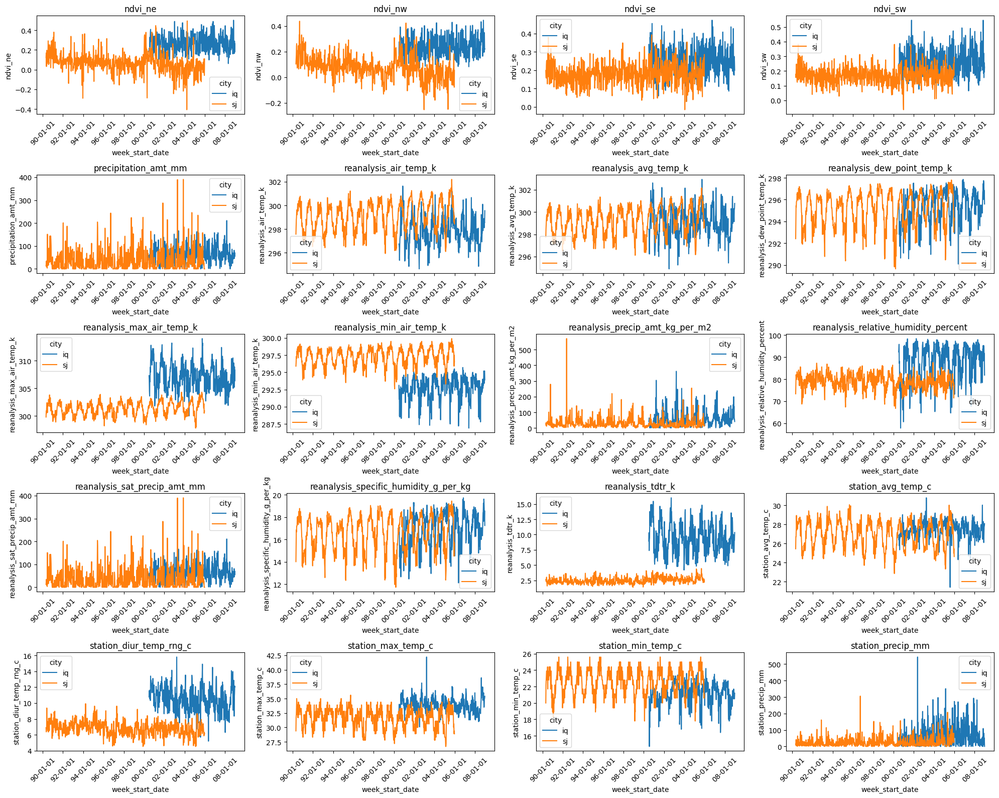

In [26]:
import matplotlib.dates as mdates

def linePlots(data, hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)  # Add this line
    plt.tight_layout()
    plt.show()

linePlots(data=df_train, hue='city')

## San Juan
- There appears to be some outliers


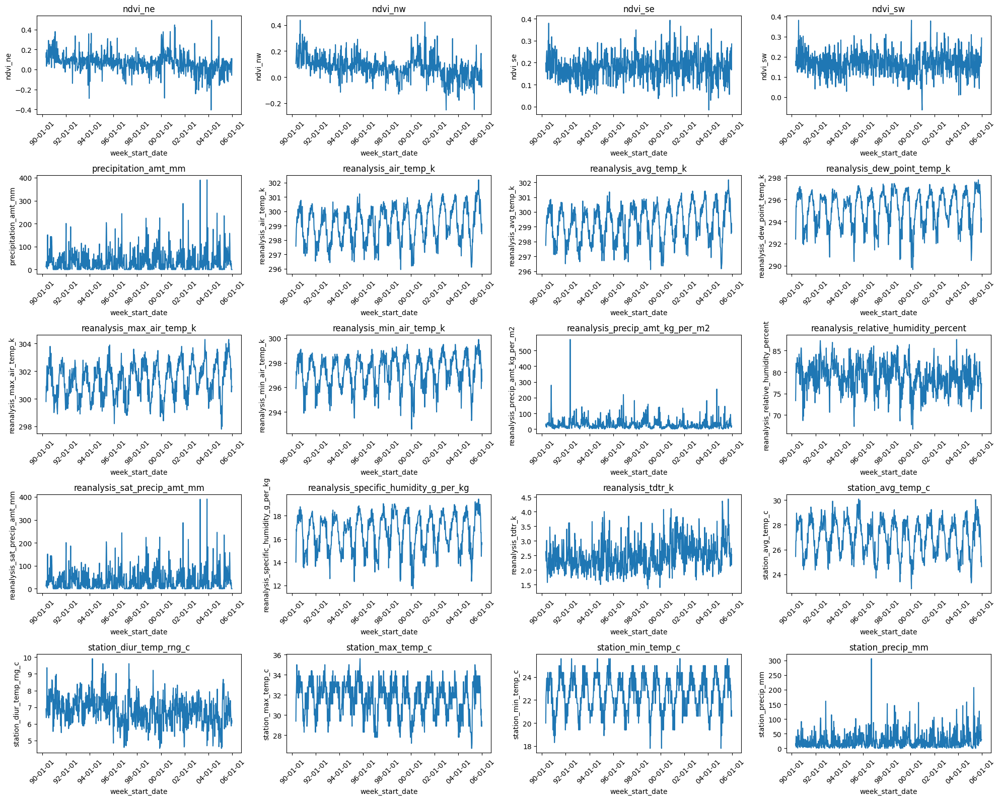

In [27]:
# Data
df_train_sj = df_train.query("city=='sj'")
linePlots(data=df_train_sj)

## Iquitos
- There appears to be some outliers

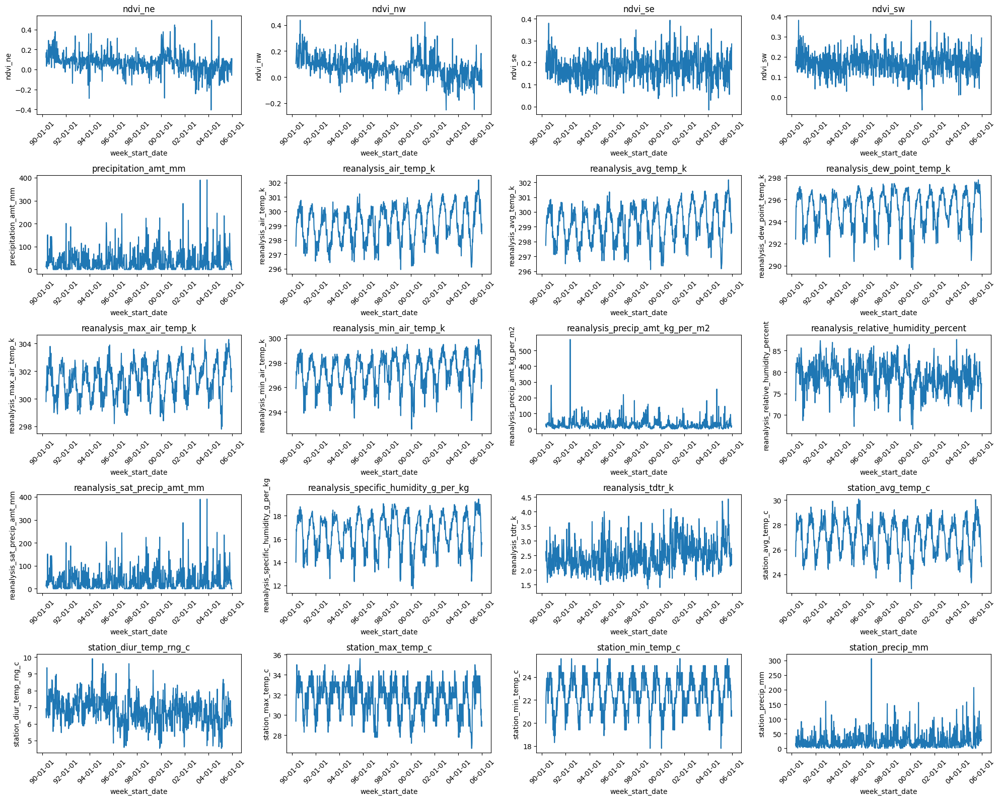

In [28]:
df_train_iq = df_train.query("city!='iq'")
linePlots(data=df_train_iq, hue=None)

## Correlation analysis
Based on the Heatmap above, we observe the following:
*   Vegetation at north east "ndvi_ne" and north west  "ndvi_nw"are highly positively correlated at 0.85 and the vegetation south east "ndvi_se" and southwest "ndvi_sw" positively correlated at 0.82
*   The Average air temperature "reanalysis_avg_temp_k" and  Mean air temperature "reanalysis_air_temp_k" are highly positively correlated at 0.90
*   The Diurnal temperature range "reanalysis_tdtr_k" and Maximum air temperature "reanalysis_max_air_temp_k" are highly positively correlated at 0.92
*    The Diurnal temperature range "reanalysis_tdtr_k" and Total precipitation "reanalysis_precip_amt_kg_per_m2" have a low correlation of 0.094
*   The Mean relative humidity "reanalysis_relative_humidity_percent" and Minimum temperature "station_min_temp_c" have low negative correlation -0.043
* All features seem be weakly correlated with `total_cases`




### Correlation San Juan

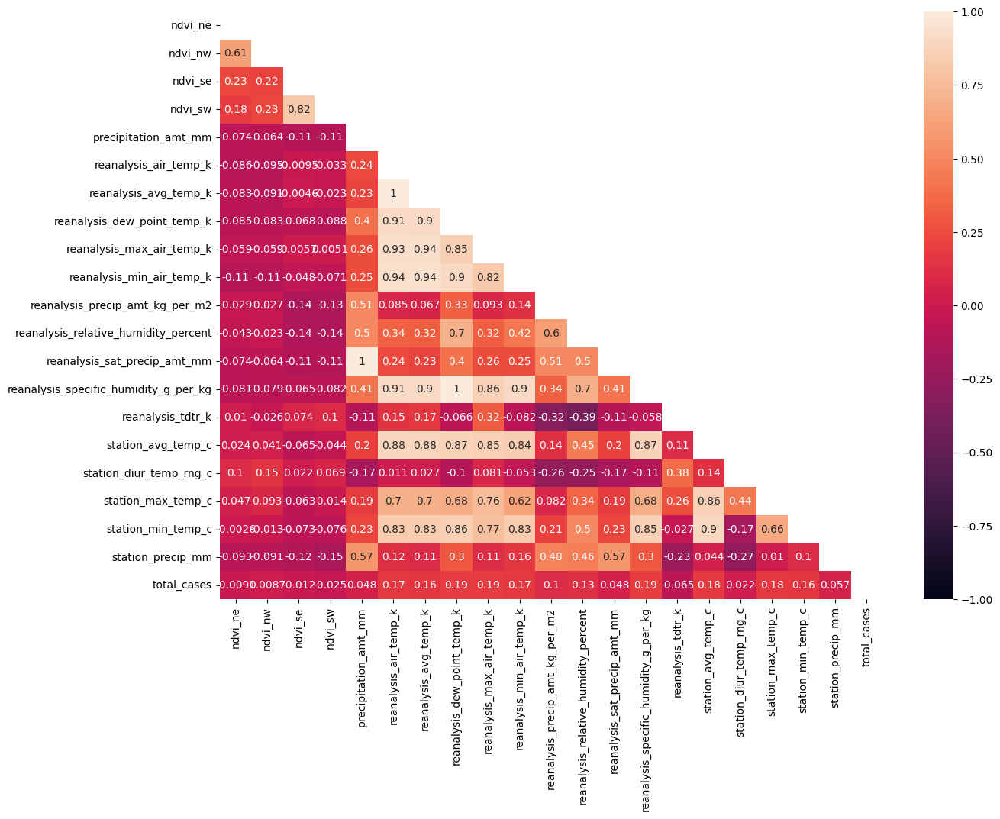

In [29]:
corrMat = df_train.loc[df_train['city']=='sj',features].corr()

mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


In [30]:
# Initialize an empty list to store correlated variable pairs
highly_corr_pairs_sj = []

# Iterate over each column in the correlation matrix
for col in corrMat.columns:
    # Find variables with correlation greater than 0.9
    high_corr_vars = corrMat[abs(corrMat[col]) > 0.9].index.to_list()

    # If there are more than one highly correlated variables
    if len(high_corr_vars) > 1:
        # Add the pairs to the list
        for var in high_corr_vars:
            if var != col:  # Avoid adding self-correlations
                highly_corr_pairs_sj.append((col, var))

# Print the list of highly correlated variable pairs
print("Highly correlated variable pairs:")
for pair in highly_corr_pairs_sj:
    print(pair)

Highly correlated variable pairs:
('precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm')
('reanalysis_air_temp_k', 'reanalysis_avg_temp_k')
('reanalysis_air_temp_k', 'reanalysis_dew_point_temp_k')
('reanalysis_air_temp_k', 'reanalysis_max_air_temp_k')
('reanalysis_air_temp_k', 'reanalysis_min_air_temp_k')
('reanalysis_air_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_avg_temp_k', 'reanalysis_air_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_max_air_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_min_air_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_dew_point_temp_k', 'reanalysis_air_temp_k')
('reanalysis_dew_point_temp_k', 'reanalysis_min_air_temp_k')
('reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_max_air_temp_k', 'reanalysis_air_temp_k')
('reanalysis_max_air_temp_k', 'reanalysis_avg_temp_k')
('reanalysis_min_air_temp_k', 'reanalysis_air_temp_k')
('reanalysis_min_air_temp_k', 'reanalysi

### Correlation -- Iquitos

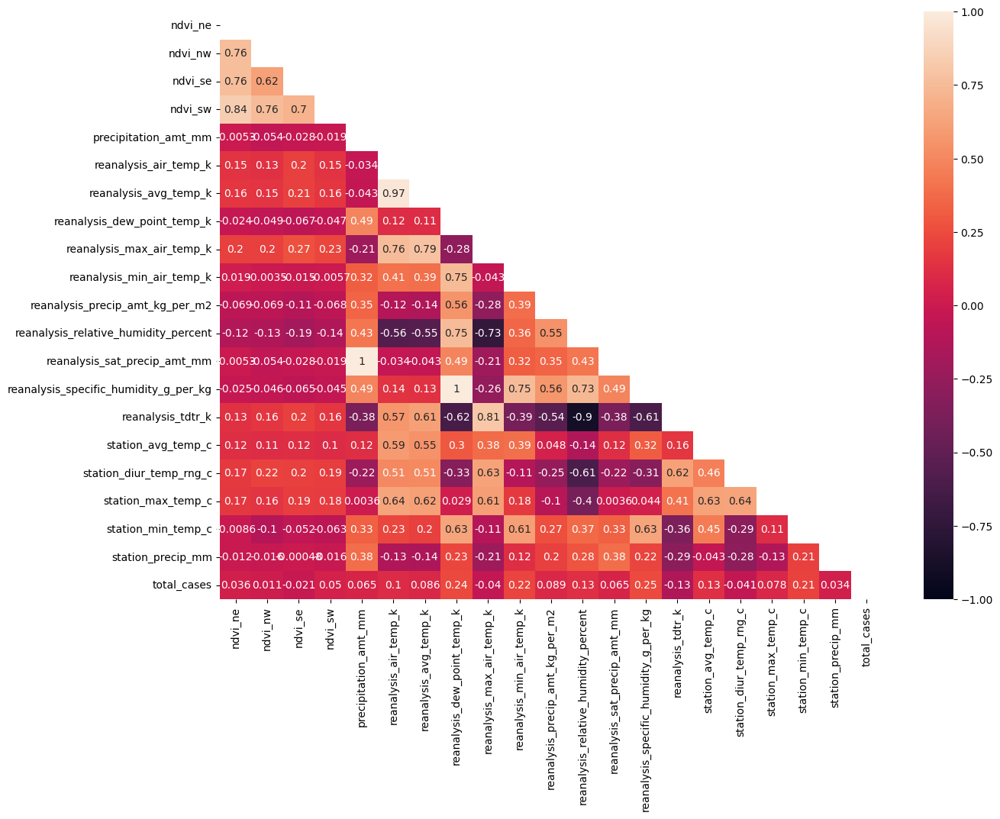

In [31]:
corrMat = df_train.loc[df_train['city']=='iq',features].corr()

mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


### Identify highly correlated variables``

In [32]:
# Initialize an empty list to store correlated variable pairs
highly_corr_pairs_iq = []

# Iterate over each column in the correlation matrix
for col in corrMat.columns:
    # Find variables with correlation greater than 0.9
    high_corr_vars = corrMat[abs(corrMat[col]) > 0.9].index.to_list()

    # If there are more than one highly correlated variables
    if len(high_corr_vars) > 1:
        # Add the pairs to the list
        for var in high_corr_vars:
            if var != col:  # Avoid adding self-correlations
                highly_corr_pairs_iq.append((col, var))

# Print the list of highly correlated variable pairs
print("Highly correlated variable pairs:")
for pair in highly_corr_pairs_iq:
    print(pair)

Highly correlated variable pairs:
('precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm')
('reanalysis_air_temp_k', 'reanalysis_avg_temp_k')
('reanalysis_avg_temp_k', 'reanalysis_air_temp_k')
('reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg')
('reanalysis_sat_precip_amt_mm', 'precipitation_amt_mm')
('reanalysis_specific_humidity_g_per_kg', 'reanalysis_dew_point_temp_k')


In [33]:
from sklearn.manifold import MDS
dist_mat=1-corrMat
mds = MDS(n_components=2, dissimilarity='precomputed', normalized_stress='auto')
mds_out = mds.fit_transform(dist_mat)

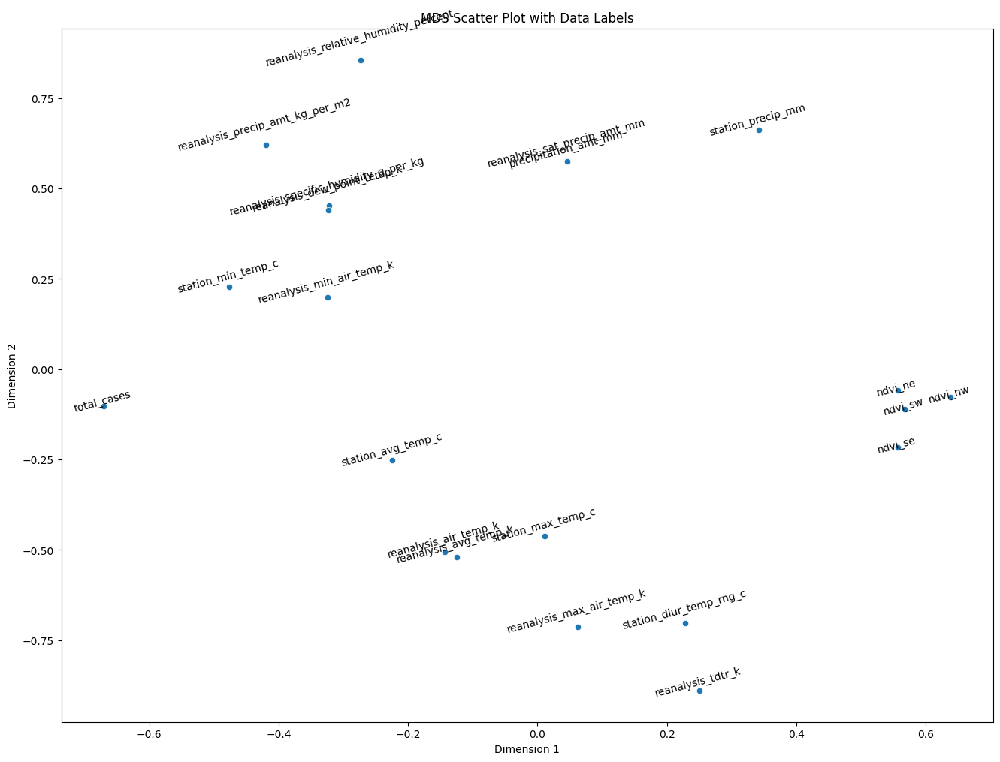

In [34]:
mds_out = pd.DataFrame(mds_out, columns=['c1', 'c2'])
mds_out.index = mds.feature_names_in_

plt.figure(figsize=(16, 12))
sns.scatterplot(data=mds_out,x='c1', y='c2')

for label, x, y in zip(mds_out.index, mds_out['c1'], mds_out['c2']):
    plt.annotate(label, (x, y), textcoords="offset points", xytext=(-1, -5), ha='center', rotation=15)

# Show the plot
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('MDS Scatter Plot with Data Labels')
plt.show()

In [35]:
mds.feature_names_in_

array(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm',
       'reanalysis_air_temp_k', 'reanalysis_avg_temp_k',
       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent',
       'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c',
       'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm',
       'total_cases'], dtype=object)

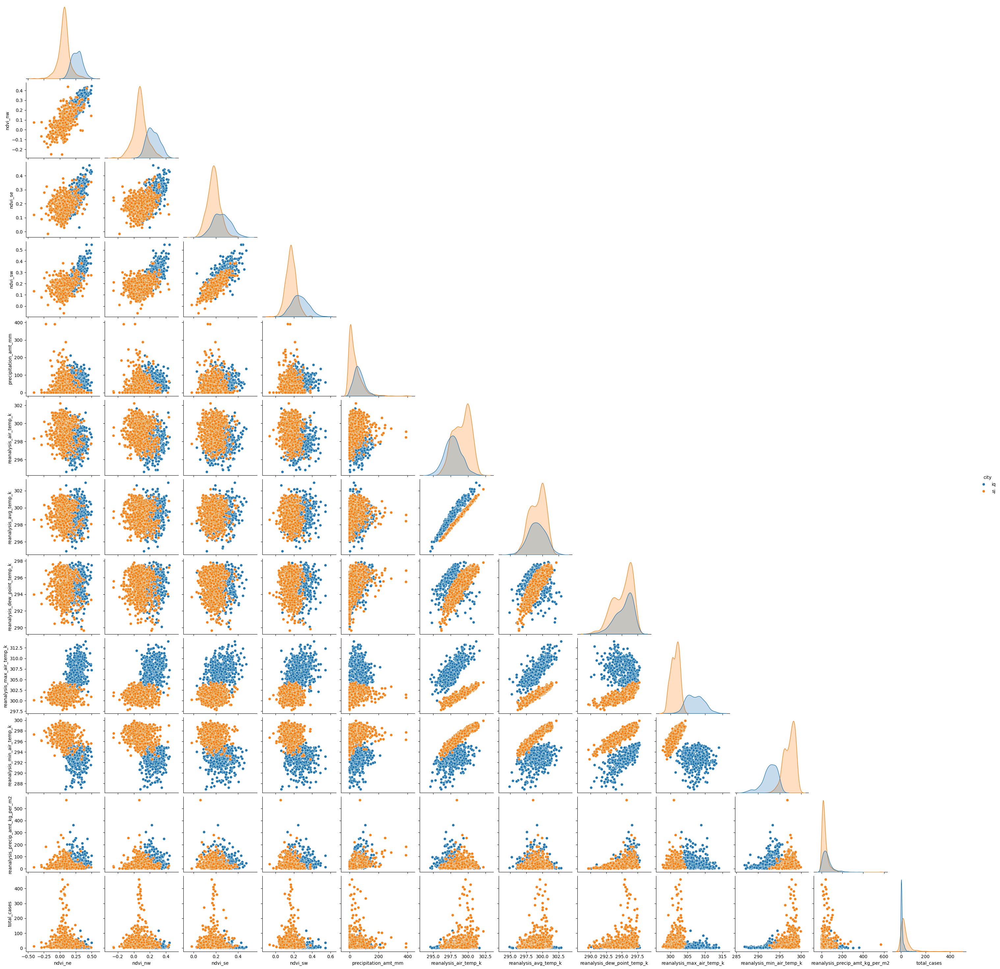

In [36]:
features_set1 = features[:11] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

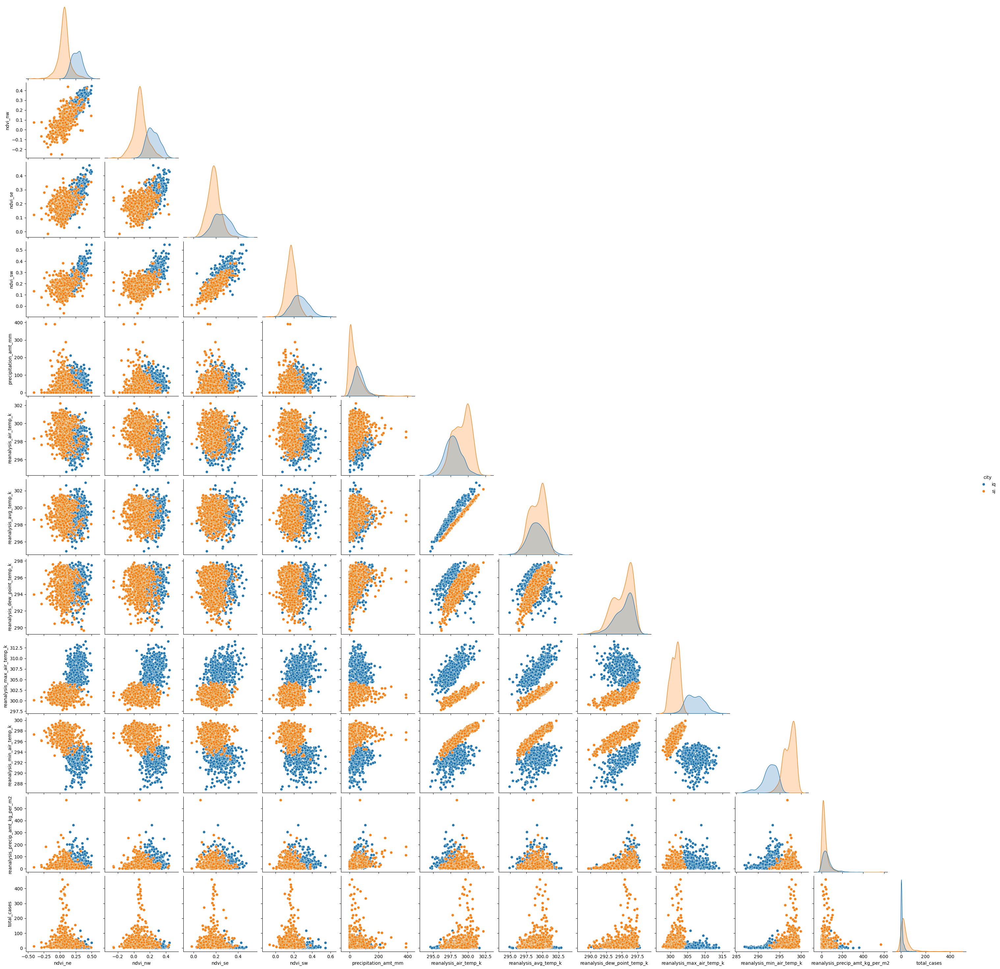

In [37]:
features_set2 = features[11:] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

## Dengue cases


## Dengue cases time series

- The data spans different periods in the two cities, with some overlaps

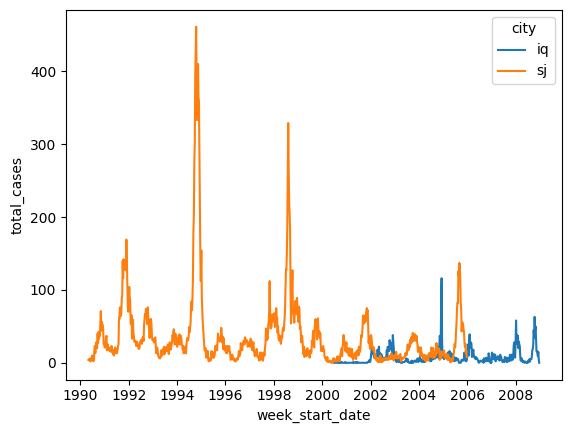

In [38]:
sns.lineplot(data=df_train, x= 'week_start_date', y = 'total_cases', hue='city')
plt.show()

## Iquitos - Total cases
- number of cases are generally high towards end of year (week 40 - 52) and at the beginning of year (week 1 to week 10)
- time feature may me important

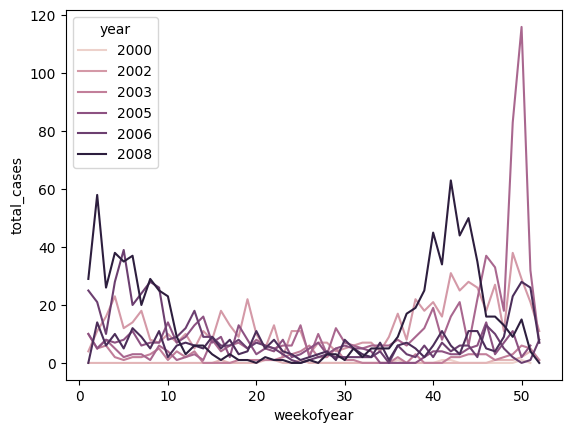

In [39]:
sns.lineplot(data=df_train.loc[df_train['city']=='iq'], x= 'weekofyear', y = 'total_cases', hue='year')
plt.show()

## Cases San Juan
- Also, number of cases are higher towards end of year from around week 35 - 52, and at the beginning of year week 1 - 10 with some few exceptions

In [40]:
# Identify outlier years
#
outlier_years_sj = df_train.loc[df_train['city']=='sj'].loc[df_train['total_cases']>200,'year'].unique()
years_sj = df_train.loc[df_train['city']=='sj']['year'].unique()
normal_years_sj = [i for i in years_sj if i not in outlier_years_sj]

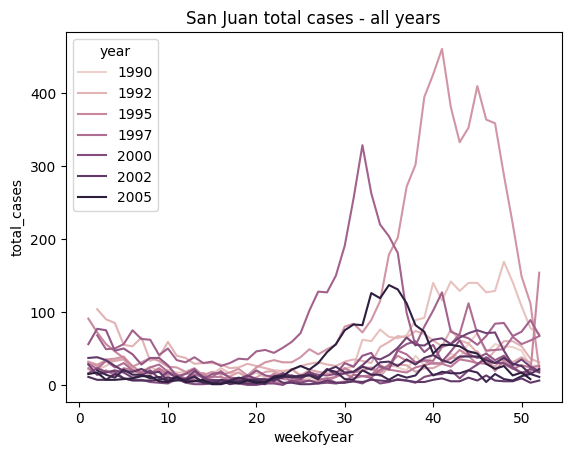

In [41]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - all years')
plt.show()

Outlier years were identified as those containing too many cases relative to others, distorting the scale. The threshold was 200 cases.

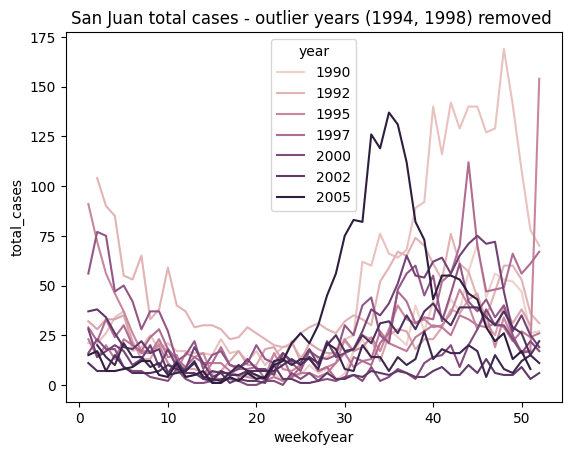

In [42]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(normal_years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - outlier years (1994, 1998) removed ')
plt.show()

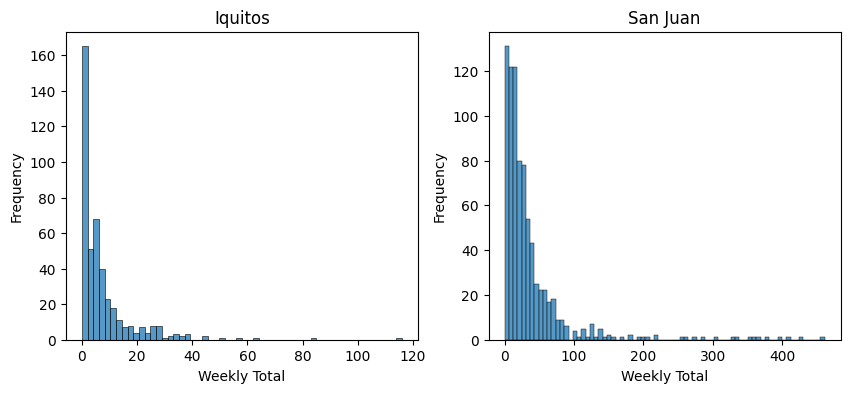

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [43]:
#
def yearly_pattern(labels_data, city_col, total_cases_col):

    cities = labels_data[city_col].unique()
    citynames = ['Iquitos', 'San Juan']
    num_cities = len(cities)
    fig, axes = plt.subplots(ncols=num_cities, figsize=(10, 4))

    # Iterate over each city and plot distplot
    for (i, city), n in zip(enumerate(cities), citynames):
        city_data = labels_data[labels_data[city_col] == city][total_cases_col]
        plt.figure(figsize=(8,6))
        sns.histplot(city_data, kde=False, ax=axes[i])
        axes[i].set_title(f'{n}')
        axes[i].set_xlabel('Weekly Total')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.savefig('distribution.png')

    # plt.show()


yearly_pattern(df_train, 'city', 'total_cases')


Seems like week 1 and week 53 are the most problematic in the dataset

In [44]:
# Computing median by week
def medianByWeek(df):
    df_med = df[features+['city','weekofyear']].groupby(['city', 'weekofyear']).agg('median').reset_index()
    rename_dict = {}
    for feature in features:
        rename_dict[feature]='med_'+feature
        df_med.rename(rename_dict, inplace=True, axis=1)
    return df_med

df_med = medianByWeek(df=df_train)

In [45]:
df_med


,city,weekofyear,med_ndvi_ne,med_ndvi_nw,med_ndvi_se,med_ndvi_sw,med_precipitation_amt_mm,med_reanalysis_air_temp_k,med_reanalysis_avg_temp_k,med_reanalysis_dew_point_temp_k,...,med_reanalysis_relative_humidity_percent,med_reanalysis_sat_precip_amt_mm,med_reanalysis_specific_humidity_g_per_kg,med_reanalysis_tdtr_k,med_station_avg_temp_c,med_station_diur_temp_rng_c,med_station_max_temp_c,med_station_min_temp_c,med_station_precip_mm,med_total_cases
0,iq,1,0.254714,0.228529,0.250586,0.270400,59.110,298.162857,299.642857,296.060000,...,93.005714,59.110,17.618571,9.757143,28.112500,9.700000,33.30,21.80,72.50,10.0
1,iq,2,0.303274,0.292350,0.290017,0.294814,70.845,297.673571,299.007143,296.157857,...,93.420000,70.845,17.730000,7.828571,27.606667,10.300000,34.20,22.25,60.80,8.0
2,iq,3,0.256493,0.195148,0.268136,0.224971,76.160,298.201429,299.796429,296.355000,...,92.165000,76.160,17.958571,8.864286,28.000000,9.900000,33.80,22.10,96.70,8.0
3,iq,4,0.231279,0.225769,0.214421,0.285093,67.035,297.870000,299.007143,295.833571,...,90.213571,67.035,17.427857,8.100000,27.940000,10.600000,33.90,21.95,56.70,8.5
4,iq,5,0.233014,0.235186,0.196486,0.205543,71.550,298.271429,299.792857,296.392143,...,93.067857,71.550,17.977143,9.042857,27.725000,10.300000,34.35,22.25,89.60,6.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,sj,48,0.108625,0.103867,0.179629,0.166186,16.860,298.832857,298.935714,295.256429,...,80.243571,16.860,16.662857,2.085714,26.335714,6.350000,30.60,22.80,29.90,40.0
100,sj,49,0.056750,0.065875,0.181267,0.206850,4.150,298.560714,298.617857,294.795714,...,78.376429,4.150,16.182857,2.000000,26.278571,6.350000,30.30,21.95,24.15,28.0
101,sj,50,-0.003900,0.014733,0.191386,0.173014,0.000,298.595000,298.667857,294.423571,...,75.265714,0.000,15.802857,2.192857,25.864286,6.607143,29.70,21.70,9.90,31.0
102,sj,51,-0.000425,0.046133,0.182817,0.170057,0.000,298.435714,298.546429,294.222857,...,77.476429,0.000,15.622857,2.200000,25.778571,6.007143,30.30,21.70,22.60,24.5


## Median of features by
 - There is considerable difference in climate and vegetation between the two cities

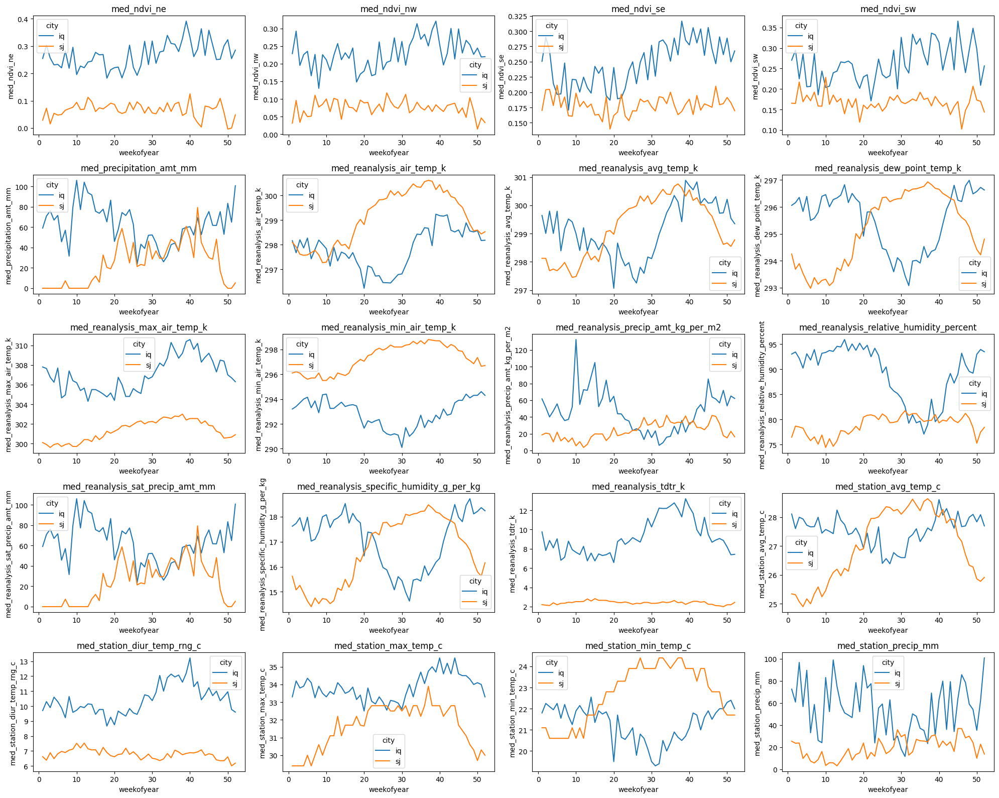

In [46]:
med_features = df_med.columns[1:]

fig, axs = plt.subplots(5,4, figsize = (20,16))
axs = axs.ravel()

for f, ax in zip(med_features[1:],axs):
    sns.lineplot(data=df_med, x = 'weekofyear', y=f, ax=ax, hue='city')
    ax.set_title(f)
plt.tight_layout()


## Features vs Target (standardized)

In [47]:
df_train_iq.columns

Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases'],
      dtype='object')

## Iquitos
Key observations:
- There is a lagged commovement between temperature and total disease cases in iquitos, eg. increase in temperature is followed by increased number of cases
- The similar effect has also been observed in humidity variable ['reanalysis_specific_humidity_g_per_kg']

In [48]:
import sklearn
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
all_scaled = scaler.fit_transform(X=df_train_iq.iloc[:,4:])
scaler.get_feature_names_out()
df_scaled = pd.DataFrame(all_scaled, columns=scaler.get_feature_names_out())
df_scaled = pd.concat((X[datetimecols], df_scaled), axis=1)

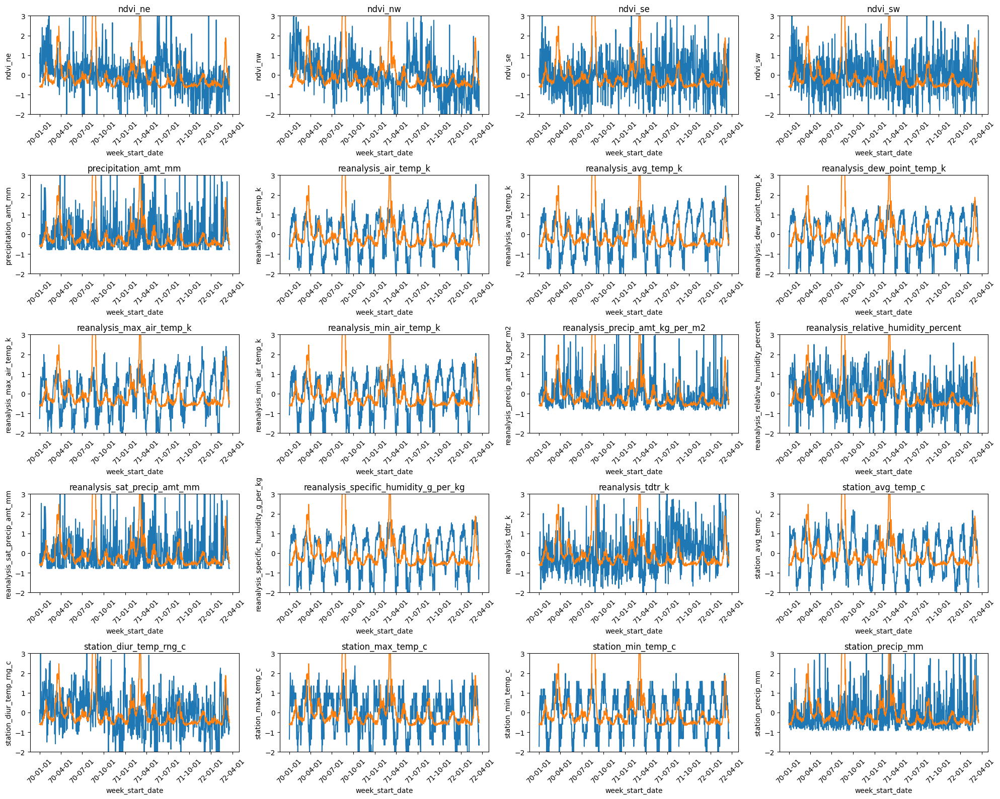

In [49]:
def linePlots2(data, features,hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        sns.lineplot(x='week_start_date', y='total_cases', ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylim(-2,3)
    plt.tight_layout()
    plt.show()

linePlots2(data=df_scaled[df_scaled['city']=='sj'], features=features)

## Box plots
- The scales of features are quite different, scling may be necessary for non-tree based algorithms
- Outliers are also evident especially for precipitation

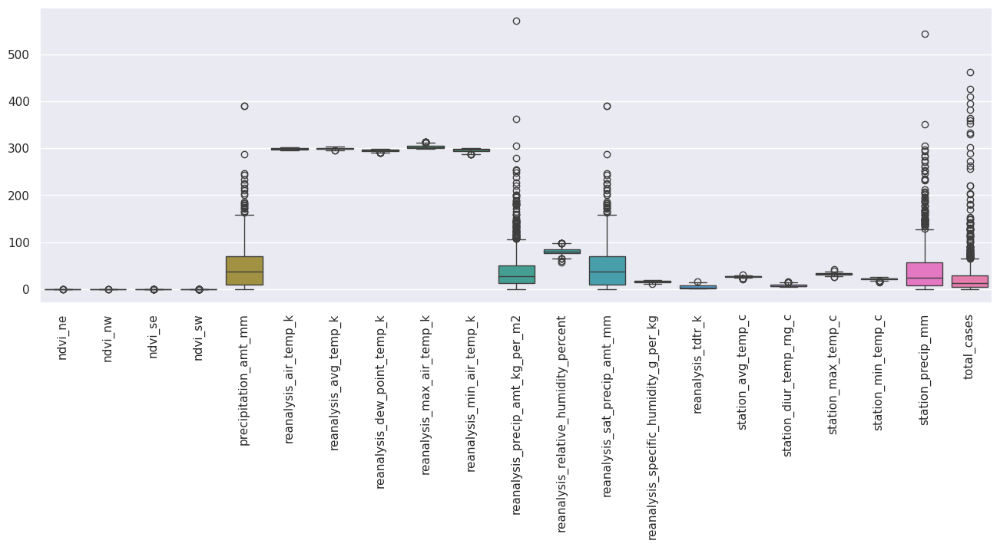

In [50]:
sns.set(rc={'figure.figsize': (16, 5)})

# Create the boxplot
ax = sns.boxplot(data=df_train[features[:]])
ax.tick_params(axis='x', rotation=90)


# Show the plot
plt.show()

### Box plots
- There is considerable difference between cities esp. for vegetation, humidity and temperature
- It may necessitate doing analysis separately
- Cases in in San Juan are generally higher compared to Iquitos

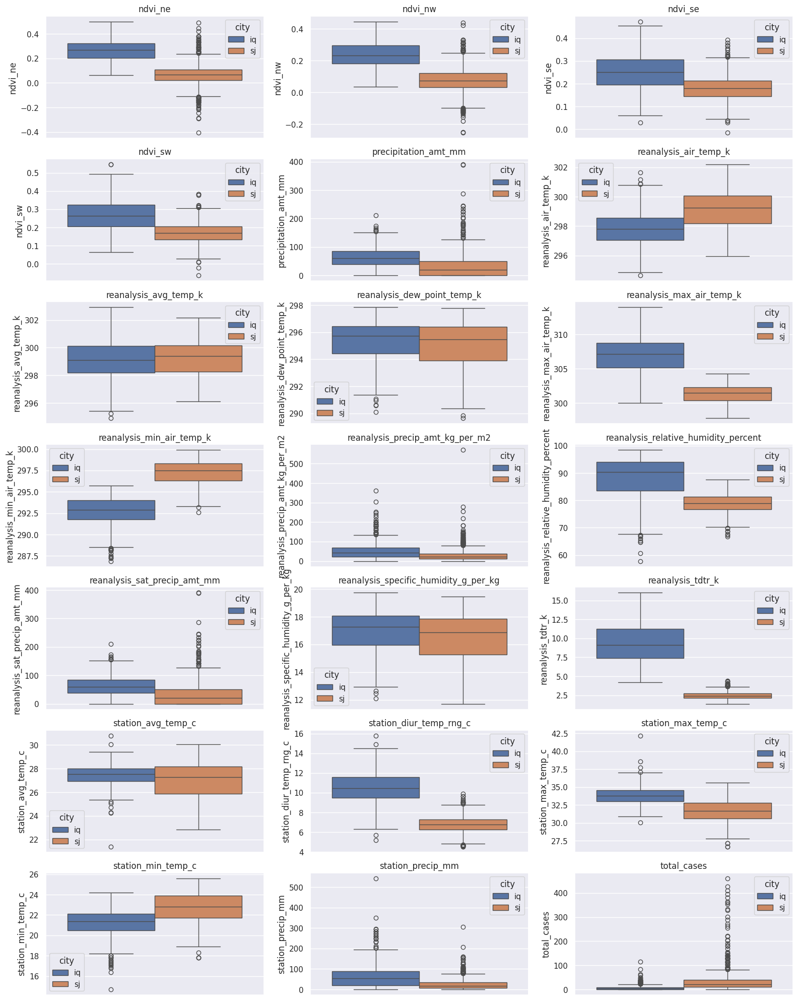

In [51]:
def boxplots(data, features,hue=None):
    fig, axs = plt.subplots(7, 3, figsize=(16, 20))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.boxplot(y=col, ax=ax, data=data, hue=hue)
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

boxplots(data=df_train, features=features, hue='city')

In [52]:
ndvi = list(filter(lambda x: re.search(r'ndvi_', x), features))
precip = list(filter(lambda x: re.search(r'preci', x), features))
humid = list(filter(lambda x: re.search(r'humid', x), features))
temp = list(filter(lambda x: re.search(r'temp|tdtr', x), features))
# tdtr = list(filter(lambda x: re.search(r'tdtr', x), features))

In [53]:
## PCA PLOTS
from sklearn.decomposition import PCA
pca = PCA(n_components=2, whiten=True)

pca_ndvi = pca.fit_transform(df_train.loc[df_train['city']=='sj',ndvi])
print('ndvi', pca.explained_variance_ratio_)
pca_ndvi = pd.DataFrame(pca_ndvi, columns=['pc1','pc2'])


pca_precip = pca.fit_transform(df_train.loc[df_train['city']=='sj',precip])
print('precip', pca.explained_variance_ratio_)
pca_precip = pd.DataFrame(pca_precip, columns=['pc1','pc2'])

pca_temp = pca.fit_transform(df_train.loc[df_train['city']=='sj',temp])
print('temp', pca.explained_variance_ratio_)
pca_temp = pd.DataFrame(pca_temp, columns=['pc1','pc2'])


ndvi [0.60810573 0.22842592]
precip [0.77866656 0.1463693 ]
temp [0.79642597 0.10359842]


In [54]:
# df_train.loc[:,'l_total_cases'] = np.log(1+df_train['total_cases'])

#EDA: Data Visualization
[Helen]

In [55]:
# df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
# df_train.set_index('week_start_date', inplace=True)

In [56]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'iq']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of Iquitos:


*   The trend appears to be stable with slight flunctuations over the years, a slight upward trend can be observed around 2005 but it returns to more average levels afterward and then rises before 2007.
*   The Seasonal pattern is clear and consistent over the years. Peaks and troughs appear regularly, indicating consistent wetter and drier periods each year.
*   The residuals, which represent the noise after removing the trend and seasonality, don't show any significant outliers or patterns. They're relatively stable and clustered around the zero line.

In [57]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'sj']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of San Juan:


*   The trend appears to be stable with slight undulations over the years, there is no strong long term increase or decrease in the population during the time period.
*   The Seasonal pattern is clear and consistent over the years. The amplitude of the season flunctuations are roughly the same size each year.
*   The residuals have a few outliers, seen as dots further away

##### Dropping one highly correlated variables from the following pairs,
- ['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
- ['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
- ['reanalysis_max_air_temp_k', 'reanalysis_tdtr_k']

## Prepare training and testing data

In [58]:
## Generate dummies for outliers
# This applies for training data, we pretend we dont know labels for testing data
df_train['month'] = df_train['week_start_date'].dt.month
df_test['total_cases'] = df_test['total_cases']+1

df_test['month'] = df_test['week_start_date'].dt.month
df_test['total_cases'] = df_test['total_cases']+1

In [59]:
df_train.loc[:,'month'].value_counts()


month
7     125
10    118
4     116
9     107
1     107
8     100
11    100
12    100
5      96
6      96
2      92
3      92
Name: count, dtype: int64

In [60]:
highly_corr_pairs_sj
for i in highly_corr_pairs_sj:
    print(i[1])




reanalysis_sat_precip_amt_mm
reanalysis_avg_temp_k
reanalysis_dew_point_temp_k
reanalysis_max_air_temp_k
reanalysis_min_air_temp_k
reanalysis_specific_humidity_g_per_kg
reanalysis_air_temp_k
reanalysis_max_air_temp_k
reanalysis_min_air_temp_k
reanalysis_specific_humidity_g_per_kg
reanalysis_air_temp_k
reanalysis_min_air_temp_k
reanalysis_specific_humidity_g_per_kg
reanalysis_air_temp_k
reanalysis_avg_temp_k
reanalysis_air_temp_k
reanalysis_avg_temp_k
reanalysis_dew_point_temp_k
precipitation_amt_mm
reanalysis_air_temp_k
reanalysis_avg_temp_k
reanalysis_dew_point_temp_k


In [61]:
# columns to drop from variable featured
# If you want to keep all variables just, change columns2drop -- leave 'total_cases' only

def features2drop(colums2drop):
    features2keep = [f for f in df_train.columns if f not in colums2drop]
    return features2keep

base_cols = ['city', 'weekofyear','year','week_start_date', 'total_cases']

colums2drop_iq = base_cols + list(set([i[1] for i in highly_corr_pairs_iq]))
colums2drop_sj = base_cols + list(set([i[1] for i in highly_corr_pairs_sj]))

features2keep_iq = features2drop(colums2drop_iq)
features2keep_sj = features2drop(colums2drop_sj)

def generate_data(input_data, city, features):
    return input_data.loc[input_data['city']==city,features]

X_train_iq = generate_data(df_train,'iq', features2keep_iq)
X_train_sj = generate_data(df_train,'sj', features2keep_sj)

X_test_iq = generate_data(df_test,'iq', features2keep_iq)
X_test_sj = generate_data(df_test,'sj', features2keep_sj)


# Target - Train
y_train_iq = df_train.loc[df_train['city']=='iq',['total_cases']]['total_cases']
y_train_sj = df_train.loc[df_train['city']=='sj',['total_cases']]['total_cases']

# Target - Test
y_test_iq = df_test.loc[df_test['city']=='iq',['total_cases']]['total_cases']
y_test_sj = df_test.loc[df_test['city']=='sj',['total_cases']]['total_cases']

# def generate_training_test_sets()
# X_train_iq = df_train.loc[df_train['city']=='iq',features2keep_iq]
# X_train_sj = df_train.loc[df_train['city']=='sj',features2keep_sj]

# Settting indices
# X_train_iq.index = df_train.loc[df_train['city']=='iq', 'week_start_date']
# X_train_sj.index = df_train.loc[df_train['city']=='sj', 'week_start_date']

# Test set
# X_test_iq = df_test.loc[df_test['city']=='iq',features2keep_iq]
# X_test_sj = df_test.loc[df_test['city']=='sj',features2keep_sj]

# Settting indices
# X_test_iq.index = df_test.loc[df_test['city']=='iq', 'week_start_date']
# X_test_sj.index = df_test.loc[df_test['city']=='sj', 'week_start_date']

# Target - Train
# y_train_iq = df_train.loc[df_train['city']=='iq',['total_cases']]['total_cases']
# y_train_sj = df_train.loc[df_train['city']=='sj',['total_cases']]['total_cases']

# Settting indices
# y_train_iq.index = df_train.loc[df_train['city']=='iq', 'week_start_date']
# y_train_sj.index = df_train.loc[df_train['city']=='sj', 'week_start_date']

# Target - Test
# y_test_iq = df_test.loc[df_test['city']=='iq',['total_cases']]['total_cases']
# y_test_sj = df_test.loc[df_test['city']=='sj',['total_cases']]['total_cases']

# y_test_iq.index = df_test.loc[df_test['city']=='iq', 'week_start_date']
# y_test_sj.index = df_test.loc[df_test['city']=='sj', 'week_start_date']



In [62]:
# features2keep_sj


In [63]:
print(f"Years Train iq: {df_train.loc[df_train['city']=='iq', 'year'].unique()}")
print(f"Years Test iq: {df_test.loc[df_test['city']=='iq', 'year'].unique()}")
# df_test['year'].unique()

Years Train iq: [2000 2001 2002 2003 2004 2005 2006 2007 2008]
Years Test iq: [2009 2010]


In [64]:
print(f"Years Train sj: {df_train.loc[df_train['city']=='sj', 'year'].unique()}")
print(f"Years Test sj: {df_test.loc[df_test['city']=='sj', 'year'].unique()}")

Years Train sj: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005]
Years Test sj: [2006 2007 2008]


## MODELS

In [65]:
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import GridSearchCV, cross_val_score, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso

CITY = 'iq'
# Model without parameter tuning - San Juan

scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])

transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])

regressor = SVR(kernel='rbf', C=0.6)
tscv = TimeSeriesSplit(n_splits=5)

target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector) ,('tranform_target', target_transformer)])
# pipeline = Pipeline(steps=[('preprocess', transformer),('tranform_target', log_target)])
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regress', regressor)])

# compute cross validation error
mae_cv = cross_val_score(estimator= pipeline,X=X_train_iq, y=y_train_iq, cv=tscv)
print(f"MAE cv {CITY} {-np.mean(mae_cv)}")


model = pipeline.fit(X=X_train_iq, y=y_train_iq)
# y_pred_tr = model.predict(X_train_iq)

y_pred_iq = model.predict(X_test_iq)



mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)
print(f"MAE: {mae:.2f}")


MAE cv iq 0.6062013890706132
MAE: 5.06


In [66]:
X_train_iq.columns

Index(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'month'],
      dtype='object')

In [67]:
lasso_selector = model.named_steps['select'].named_steps['lasso']

# Get the selected feature indices
selected_feature_indices = lasso_selector.get_support()

# Get the selected feature names
selected_feature_names = X_train_iq.columns[selected_feature_indices]
print(selected_feature_names)

Index(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_max_temp_c', 'station_min_temp_c',
       'station_precip_mm', 'month'],
      dtype='object')


### plot predicted vs actuals

In [68]:
def plot_predict(source_data, actual, predicted):
    df_pred = pd.DataFrame({'Actual': actual, 'Predicted': predicted})
    df_pred.index = source_data['week_start_date']
    plt.figure(figsize=(6, 4))
    plt.plot(df_pred['Actual'], label='Actual')
    plt.plot(df_pred['Predicted'], label='Predicted')
    plt.legend()
    plt.xticks(rotation=90)

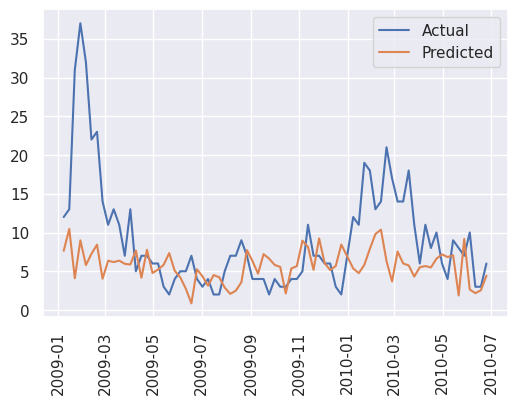

In [69]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

In [70]:
# # Model without parameter tuning - San Juan
# scaler = Pipeline([('scaler', StandardScaler())])
# selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])

# transformer = ColumnTransformer([('scaler', scaler, features2keep_sj)])

# regressor = SVR(kernel='rbf')

# target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

# pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector) ,('target_transform', target_transformer)])

# mae_cv = cross_val_score(estimator=pipeline,X=X_train_sj,y=y_train_sj, cv=tscv)
# print(f"MAE CV {-np.mean(mae_cv):.2f}")

# model = pipeline.fit(X=X_train_sj, y=y_train_sj)
# # y_pred_tr = model.predict(X_train_iq)

# y_pred_sj = model.predict(X_test_sj)

# mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)
# print(f"MAE: {mae:.2f}")

In [71]:
# plt.plot(np.array(y_test_sj))
# plt.plot(y_pred_sj)


## Finetuning SVR

In [72]:
# Engineering time features
from sklearn.preprocessing import FunctionTransformer
def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(x / period * 2 * np.pi))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(x / period * 2 * np.pi))


In [73]:
from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
import numpy as np

CITY = 'iq'

# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])



# Define the transformed target regressor
regressor = SVR()
target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
pipeline = Pipeline(steps=[('preprocess', transformer),('select', selector), ('transform_target', target_transformer)])

# Define the hyperparameter grid for grid search
param_grid = {
    'transform_target__regressor__C': np.linspace(0.01, 1, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear'],
    'transform_target__regressor__gamma': np.linspace(0.001, 0.1, 20)
}

# Perform grid search

tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring='neg_mean_absolute_error')
models = grid_search.fit(X=X_train_iq, y=y_train_iq)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, scoring='neg_mean_absolute_error')

mean_mae_cv = round(-np.mean(best_model_mae_cv),3)
sd_mae_cv = round(np.std(best_model_mae_cv),3)

print(f"Cross-validated MAE -{CITY}: {mean_mae_cv:.2f}")

y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)
print(f"MAE on test set -{CITY}: {mae:.2f}")


# save results
res_svr_iq = {'algorithm': ['SVR'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [round(mae,3)]
         }

res_svr_iq


Cross-validated MAE -iq: 6.85
MAE on test set -iq: 4.82


{'algorithm': ['SVR'],
 'city': ['Iquitos'],
 'MAE CV': [6.852],
 'MAE SD': [1.694],
 'MAE test': [4.822]}

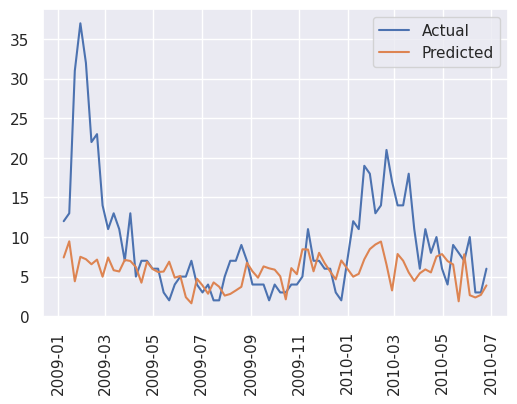

In [74]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

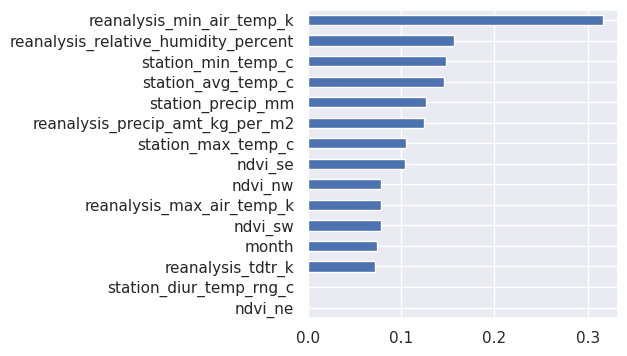

In [75]:
# feature importance
from sklearn.inspection import permutation_importance
importance_svm_iq = permutation_importance(best_model, X_train_iq, y_train_iq, scoring= 'neg_mean_absolute_error', n_repeats=200, random_state=2024)
pd.Series(importance_svm_iq.importances_mean, index=X_train_iq.columns).sort_values().plot.barh(figsize=(4,4))
plt.show()

In [76]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor.get_params()

{'C': 0.45,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'epsilon': 0.1,
 'gamma': 0.08957894736842105,
 'kernel': 'rbf',
 'max_iter': -1,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

### SVR for San Juan Tuning


In [77]:

CITY = 'sj'

# Define the preprocessing steps
scaler = Pipeline([('scaler', StandardScaler())])
# selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.5)))])
# transformer = ColumnTransformer([('scaler', scaler, features2keep_sj)])
transformer = ColumnTransformer([('scaler', scaler, features2keep_sj),
                                 ("month_sin", sin_transformer(12), ["month"]),
                                 ("month_cos", cos_transformer(12), ["month"])], remainder="passthrough")

# ('selector', selector, features2keep_sj)

# Define the transformed target regressor
regressor = SVR()
target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)


# Create the pipeline
pipeline = Pipeline(steps=[('preprocess', transformer), ('transform_target', target_transformer)])
# pipeline = Pipeline(steps=[('preprocess', transformer), ('transform_target', target_transformer)])

param_grid = {
    'transform_target__regressor__C': np.linspace(0.1, 1, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear'],
    # 'select__lasso__estimator__alpha':[0]
    # 'transform_target__regressor__gamma': np.linspace(0.001, 0.1, 10)
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, scoring='neg_mean_absolute_error')

models = grid_search.fit(X=X_train_sj, y=y_train_sj)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, scoring='neg_mean_absolute_error')

mean_mae_cv = round(-np.mean(best_model_mae_cv),3)
sd_mae_cv = round(np.std(best_model_mae_cv),3)

print(f"Cross-validated MAE -{CITY}: {-np.mean(best_model_mae_cv):.2f}")

y_pred_sj = best_model.predict(X_test_sj)
mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)
print(f"MAE on test set -{CITY}: {mae:.2f}")


# save results
res_svr_sj = {'algorithm': ['SVR'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [round(mae,3)]
         }

res_svr_sj

Cross-validated MAE -sj: 24.26
MAE on test set -sj: 14.29


{'algorithm': ['SVR'],
 'city': ['San Juan'],
 'MAE CV': [24.256],
 'MAE SD': [9.928],
 'MAE test': [14.295]}

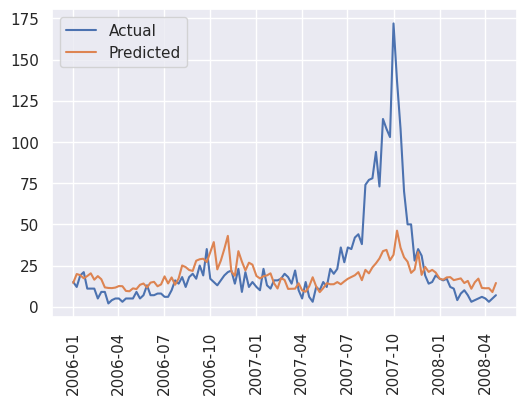

In [78]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)


In [79]:
# %pip install protobuf

## LSTM

In [80]:
# import tensorflow as tf
# from sklearn.preprocessing import StandardScaler
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import LSTM, Dense, InputLayer, Dropout, Attention
# from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
# from tensorflow.keras.losses import MeanSquaredError, MeanAbsoluteError
# from tensorflow.keras.metrics import MeanAbsoluteError
# from tensorflow.keras.optimizers import Adam
# from keras.optimizers import Adam

# tf.random.set_seed(2024)

# # Prepare data
# time_steps = 4

# def data_to_3D(dfx, dfy, time_steps):
#     X = []
#     y = []
#     for i in range(len(dfx) - time_steps):
#         X.append(dfx[i:i+time_steps])  # Extracting past 'time_steps' weeks data for each sample
#         y.append(dfy.values[i+time_steps])     # Extracting the target variable for the next week
#     return np.array(X), np.array(y)


# scaler = RobustScaler()

# # Training and validation data
# XX_train_iq1, yy_train_iq1 = X_train_iq.iloc[:len(X_train_iq)-103,:], y_train_iq[:len(y_train_iq)-103]
# XX_val_iq1, yy_val_iq1 = X_train_iq.iloc[len(X_train_iq)-103:,:], y_train_iq[len(y_train_iq)-103:]

# # scale data
# XX_train_iq2 = scaler.fit_transform(XX_train_iq1)
# XX_val_iq2 = scaler.fit_transform(XX_val_iq1)
# X_test_iq2 = scaler.fit_transform(X_test_iq)
# # Converting data to 3D
# XX_train_iq, yy_train_iq = data_to_3D(XX_train_iq2, yy_train_iq1, time_steps=time_steps)
# XX_val_iq, yy_val_iq = data_to_3D(XX_val_iq2, yy_val_iq1, time_steps=time_steps)
# XX_test_iq, yy_test_iq = data_to_3D(X_test_iq2, y_test_iq, time_steps=time_steps)
# # # scale
# # X_test_iq = scaler.fit_transform(X_test_iq)


# model = Sequential([
#     InputLayer(input_shape=(time_steps, len(X_train_iq.columns))),
#     LSTM(5),
#     Dropout(0.2),
#     # Attention(name='attention_weights'),
#     Dense(units=500, activation='relu'),
#     Dense(units=100, activation='relu'),
#     Dense(units=1, activation='linear')
# ])

# model.summary()

# early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# check_point = ModelCheckpoint('model/', save_best_only=True)

# model.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.01), metrics=[MeanAbsoluteError()])
# model.fit(XX_train_iq, yy_train_iq, validation_data=(XX_val_iq, yy_val_iq), epochs=60, callbacks=[early_stopping,check_point])



In [81]:
# from tensorflow.keras.models import load_model
# model = load_model('model/')

# pred_train = model.predict(XX_val_iq).flatten()
# output_train = pd.DataFrame({'Pred Train': pred_train, 'Actual':yy_val_iq})
# # output_train
# plt.plot(output_train['Pred Train'])
# plt.plot(output_train['Actual'])


In [82]:
# from tensorflow.keras.models import load_model
# model = load_model('model/')

# pred_test = model.predict(XX_test_iq).flatten()
# output_test = pd.DataFrame({'Pred': pred_test, 'Actual':yy_test_iq})
# # output_train
# plt.plot(output_test['Pred'])
# plt.plot(output_test['Actual'])
# print(f"MAE {mean_absolute_error(y_pred=pred_test, y_true=yy_test_iq)}")


## XGboost - Iq

In [83]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [84]:
import xgboost
from xgboost import XGBRegressor


CITY = 'iq'

# Define the preprocessing steps
scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])

# Define the transformed target regressor
xgb = XGBRegressor()

# xgb.fit(X_train_iq, y_train_iq)
target_transformer = TransformedTargetRegressor(regressor=xgb, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
tscv = TimeSeriesSplit(n_splits=5)


# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep_iq)])
# transformer = ColumnTransformer([('scaler', scaler, features2keep_iq),
                                #  ("month_sin", sin_transformer(12), ["month"]),
                                #  ("month_cos", cos_transformer(12), ["month"])], remainder="passthrough")

# Define the transformed target regressor
xgb = XGBRegressor()

# xgb.fit(X_train_iq, y_train_iq)
target_transformer = TransformedTargetRegressor(regressor=xgb, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
tscv = TimeSeriesSplit(n_splits=5)
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regressor', xgb)])
pipeline = Pipeline(steps=[('preprocess', transformer), ('target_transformer', target_transformer)])


param_grid = {
    'target_transformer__regressor__learning_rate': [0.001,0.05,0.09],
    'target_transformer__regressor__max_depth': [3, 4, 6, 10],
    'target_transformer__regressor__gamma': [0.01, 0.02],
    'target_transformer__regressor__n_estimators': [100,300],
    'target_transformer__regressor__reg_lambda': [1,3,5],
}


grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='neg_mean_absolute_error', n_jobs=-1, cv=tscv)

model = grid_search.fit(X_train_iq, y_train_iq)
best_model = model.best_estimator_
mae_cv = cross_val_score(best_model, X_train_iq, y_train_iq, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
mean_mae_sd = np.std(mae_cv)

# mae = mean_absolute_error(y_pred=y_pred_iq, y_true=y_test_iq )
y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_pred=y_pred_iq, y_true=y_test_iq)

print(f"CV MAE {-np.mean(mae_cv)}")
print(f"Test MAE: {mae}")

# save results
res_xgb_iq = {'algorithm': ['XGboost'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_xgb_iq


CV MAE 0.6521963760519973
Test MAE: 5.085305893107464


{'algorithm': ['XGboost'],
 'city': ['Iquitos'],
 'MAE CV': [0.6521963760519973],
 'MAE SD': [9.928],
 'MAE test': [5.085305893107464]}

### plot predicted vs actuals

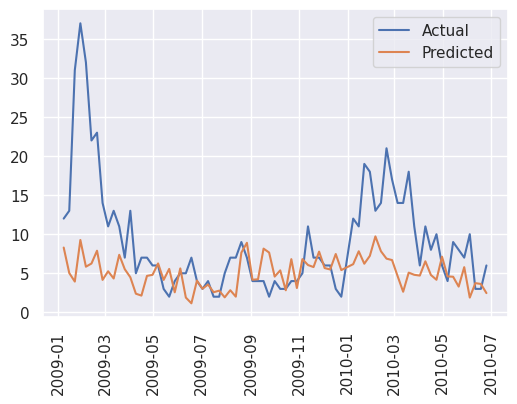

In [85]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

In [86]:
best_model.named_steps['target_transformer']

TransformedTargetRegressor(func=<ufunc 'log1p'>, inverse_func=<ufunc 'expm1'>,
                           regressor=XGBRegressor(base_score=None, booster=None,
                                                  callbacks=None,
                                                  colsample_bylevel=None,
                                                  colsample_bynode=None,
                                                  colsample_bytree=None,
                                                  device=None,
                                                  early_stopping_rounds=None,
                                                  enable_categorical=False,
                                                  eval_metric=None,
                                                  feature_types=None,
                                                  gamma=0.02, grow_policy=None,
                                                  importance_type=None,
                                                  interaction_constraints=None,
                                                  learning_rate=0.05,
                                                  max_bin=None,
                                                  max_cat_threshold=None,
                                                  max_cat_to_onehot=None,
                                                  max_delta_step=None,
                                                  max_depth=3, max_leaves=None,
                                                  min_child_weight=None,
                                                  missing=nan,
                                                  monotone_constraints=None,
                                                  multi_strategy=None,
                                                  n_estimators=100, n_jobs=None,
                                                  num_parallel_tree=None,
                                                  random_state=None, ...))

## Finetune xgb

In [88]:
CITY = 'sj'

# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
# selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
# transformer = ColumnTransformer([('scaler', scaler, features2keep_sj)])
transformer = ColumnTransformer([('scaler', scaler, features2keep_sj),
                                 ("month_sin", sin_transformer(12), ["month"]),
                                 ("month_cos", cos_transformer(12), ["month"])], remainder="passthrough")


# Define the transformed target regressor
xgb = XGBRegressor()

# xgb.fit(X_train_iq, y_train_iq)
target_transformer = TransformedTargetRegressor(regressor=xgb, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
tscv = TimeSeriesSplit(n_splits=5)
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regressor', xgb)])
pipeline = Pipeline(steps=[('preprocess', transformer), ('target_transformer', target_transformer)])

param_grid = {
    'target_transformer__regressor__learning_rate': [0.001, 0.005, 0.09],
    'target_transformer__regressor__max_depth': [4, 6, 7,12],
    'target_transformer__regressor__gamma': [0.01, 0.02],
    'target_transformer__regressor__n_estimators': [500, 700]
}


grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring='neg_mean_absolute_error', n_jobs=-1, cv=tscv)

model = grid_search.fit(X_train_sj, y_train_sj)

best_model = model.best_estimator_
mae_cv = cross_val_score(best_model, X_train_sj, y_train_sj, cv=tscv)
mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# mae = mean_absolute_error(y_pred=y_pred_iq, y_true=y_test_iq )
y_pred_sj = best_model.predict(X_test_sj)
mae = mean_absolute_error(y_pred=y_pred_sj, y_true=y_test_sj)

print(f"CV MAE {-np.mean(mae_cv)}")
print(f"Test MAE San Juan {mae}")


res_xgb_sj = {'algorithm': ['XGboost'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_xgb_sj

CV MAE 0.016135243455912995
Test MAE San Juan 15.288142472259269


{'algorithm': ['XGboost'],
 'city': ['San Juan'],
 'MAE CV': [0.016135243455912995],
 'MAE SD': [0.06611116215257008],
 'MAE test': [15.288142472259269]}

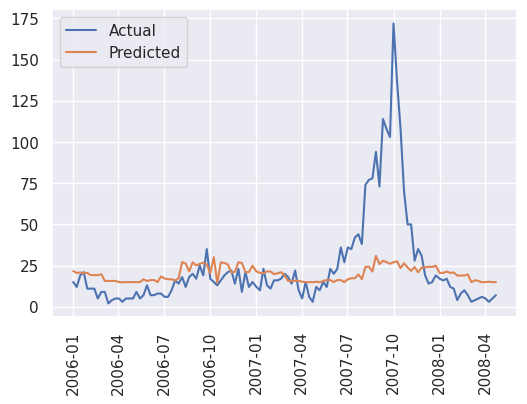

In [89]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

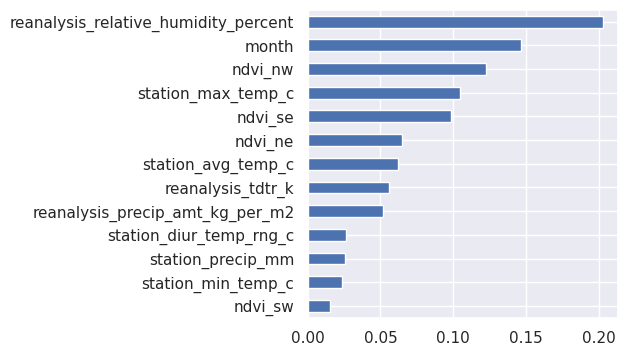

In [90]:
# Feature importances
importance_xgb_sj =  best_model.named_steps['target_transformer'].regressor.fit(X_train_sj,y_train_sj).feature_importances_
importance_xgb_sj = pd.Series(importance_xgb_sj,X_train_sj.columns)
importance_xgb_sj.sort_values().plot.barh(figsize=(4,4))
plt.show()



POISSON REGRESSION


In [91]:
from sklearn.linear_model import PoissonRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler


pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',PoissonRegressor())])
# make_pipeline(StandardScaler(), PoissonRegressor())

param_grid = {
    'regressor__alpha': [2.0, 3.0, 5.0],   # Regularization parameter (L1)
    'regressor__fit_intercept': [True, False],  # Whether to fit an intercept term
    'regressor__max_iter': [200, 300,500],  # Maximum number of iterations
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv)

# Fit the model for Iquitos
model = grid_search.fit(X_train_iq, y_train_iq)
best_model = model.best_estimator_

mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_iq = best_model.predict(X_test_iq)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_iq, y_pred_iq)


res_poisson_iq = {'algorithm': ['Poisson'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_poisson_iq



{'algorithm': ['Poisson'],
 'city': ['Iquitos'],
 'MAE CV': [2.227642699903818],
 'MAE SD': [3.6720365397861117],
 'MAE test': [5.01860748305861]}

In [92]:
poisson=best_model.named_steps['regressor']
poisson.get_params()

{'alpha': 5.0,
 'fit_intercept': True,
 'max_iter': 200,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

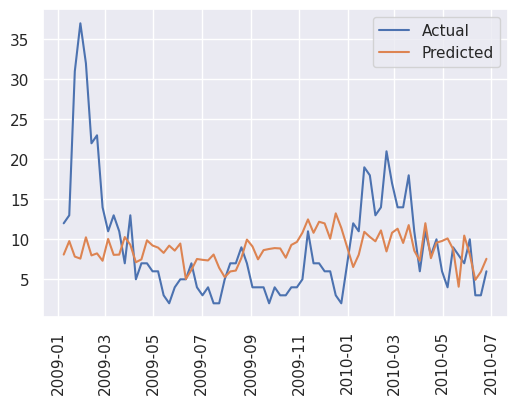

In [93]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

In [94]:

pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',PoissonRegressor())])
# make_pipeline(StandardScaler(), PoissonRegressor())

param_grid = {
    'regressor__alpha': np.linspace(0,20, 10),   # Regularization parameter (L1)
    'regressor__fit_intercept': [True, False],  # Whether to fit an intercept term
    'regressor__max_iter': [500, 1000],  # Maximum number of iterations
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv)

# Fit the model for Iquitos
model = grid_search.fit(X_train_sj, y_train_sj)
best_model = model.best_estimator_

mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_sj = best_model.predict(X_test_sj)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_sj, y_pred_sj)


res_poisson_sj = {'algorithm': ['Poisson'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_poisson_sj


{'algorithm': ['Poisson'],
 'city': ['San Juan'],
 'MAE CV': [0.7619951344217766],
 'MAE SD': [0.9795145122027621],
 'MAE test': [19.61827562706098]}

In [95]:

poisson=best_model.named_steps['regressor']
poisson.get_params()

{'alpha': 20.0,
 'fit_intercept': True,
 'max_iter': 500,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

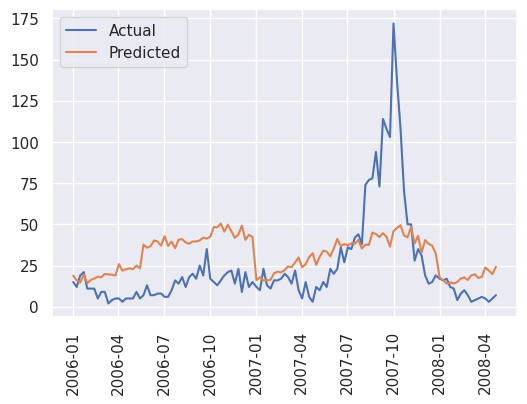

In [96]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

RANDOM FOREST

In [97]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import cross_val_score

scaler = StandardScaler()
transformer = ColumnTransformer([('scaler', scaler, features2keep_sj),
                                 ("month_sin", sin_transformer(12), ["month"]),
                                 ("month_cos", cos_transformer(12), ["month"])], remainder="passthrough")

pipeline = Pipeline(steps=[('transformer', transformer),
                           ('regressor',RandomForestRegressor(random_state=2024,n_jobs=-1))])
# make_pipeline(StandardScaler(), PoissonRegressor())

param_grid = {
    'regressor__n_estimators': [200, 300, 500],   # Regularization parameter (L1)
    'regressor__max_depth': [3,6,10],
    # 'regressor__min_samples_split': [3,5,10],
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, scoring='neg_mean_absolute_error')

# Fit the model for Iquitos
model = grid_search.fit(X_train_sj, y_train_sj)
best_model = model.best_estimator_

mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_sj = best_model.predict(X_test_sj)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_sj, y_pred_sj)


res_rf_sj = {'algorithm': ['Random Forest'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_rf_sj



{'algorithm': ['Random Forest'],
 'city': ['San Juan'],
 'MAE CV': [2.5774919192117585],
 'MAE SD': [3.6798013214820453],
 'MAE test': [19.15609455995856]}

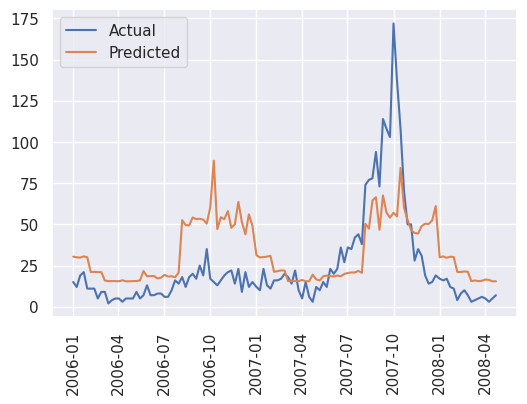

In [98]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

In [99]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import cross_val_score


pipeline = Pipeline(steps=[('scaler', StandardScaler()), ('regressor',RandomForestRegressor(random_state=2024, n_jobs=-1))])
# make_pipeline(StandardScaler(), PoissonRegressor())

param_grid = {
    'regressor__n_estimators': [200, 300, 500],   # Regularization parameter (L1)
    'regressor__max_depth': [3,6,10],  # Whether to fit an intercept term
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, scoring='neg_mean_absolute_error')

# Fit the model for Iquitos
model = grid_search.fit(X_train_iq, y_train_iq)
best_model = model.best_estimator_

mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, cv=tscv)

mean_mae_cv = -np.mean(mae_cv)
sd_mae_cv = np.std(mae_cv)

# Predict for Iquitos
y_pred_iq = best_model.predict(X_test_iq)

# Calculate Mean Absolute Error for Iquitos
mae = mean_absolute_error(y_test_iq, y_pred_iq)


res_rf_iq = {'algorithm': ['Random Forest'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
       'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_rf_iq



{'algorithm': ['Random Forest'],
 'city': ['San Juan'],
 'MAE CV': [1.1688518453968766],
 'MAE SD': [0.9104343652973855],
 'MAE test': [4.985070077492249]}

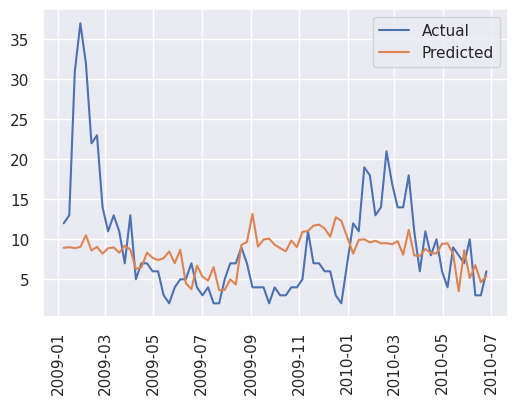

In [100]:
plot_predict(df_test_iq, y_test_iq, y_pred_iq)

## Gradient Boosted Tree(GBT) Regressor.

IQUITOS

Finetuning - Gradient Boosting Regressor- San Iquitos

In [101]:
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import GridSearchCV, cross_val_score, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.pipeline import Pipeline

CITY = 'Iquitos'

# Model with parameter tuning - San Iquitos
GB = GradientBoostingRegressor()
scaler = Pipeline([('scaler', RobustScaler())])

transformer = ColumnTransformer([('scaler', StandardScaler(), features2keep_iq)]) #appling standardization to the features

# Defining target transformation
target_transformer = TransformedTargetRegressor(regressor=GB, func=np.log1p, inverse_func=np.expm1) #appling a transformation to the target variable before fitting the model (here using np.log1p for log transformation, and np.expm1 for the inverse to transform back predictions).


# Define the pipeline
pipeline = Pipeline([('preprocess', transformer),\
    ('transform_target', target_transformer)])

param_grid = {'transform_target__regressor__learning_rate': [0.01, 0.1, 1],
    'transform_target__regressor__n_estimators': [50, 100, 200],
    'transform_target__regressor__max_depth': [3, 5, 10],
}


# Perform grid search
tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring ='neg_mean_absolute_error')
model = grid_search.fit(X=X_train_iq, y=y_train_iq)
best_model = model.best_estimator_


#Evaluate the best model
best_model_mae_cv = cross_val_score(estimator = best_model, X=X_train_iq, y=y_train_iq, scoring ='neg_mean_absolute_error')

print(f"Cross-validated MAE {CITY}: {-np.mean(best_model_mae_cv):.2f}")


y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_true= y_test_iq, y_pred=y_pred_iq)

sd_mae_cv =np.std(best_model_mae_cv)
mean_mae_cv = -np.mean(best_model_mae_cv)




res_GBT_iq = {
    'algorithm': ['GBT'],
    'city': [CITY],
    'MAE CV': [mean_mae_cv],
    'MAE SD': [sd_mae_cv],
    'MAE test': [mae]
}
res_GBT_iq

Cross-validated MAE Iquitos: 6.53


{'algorithm': ['GBT'],
 'city': ['Iquitos'],
 'MAE CV': [6.529509039253648],
 'MAE SD': [1.676100522709565],
 'MAE test': [5.2634143895815155]}

In [102]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor.get_params()

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.01,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

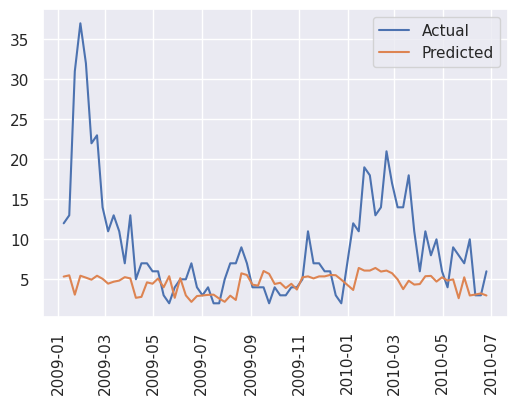

In [103]:

plot_predict(df_test_iq, y_test_iq, y_pred_iq)

## SAN JUAN

Finetuning - Gradient Boosting Regressor- San Juan

In [104]:
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import GridSearchCV, cross_val_score, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.pipeline import Pipeline

CITY = 'San Juan'

# Model with parameter tuning - San Juan
GB = GradientBoostingRegressor()
scaler = Pipeline([('scaler', RobustScaler())])

transformer = ColumnTransformer([('scaler', StandardScaler(), features2keep_sj)]) #appling standardization to the features

# Defining target transformation
target_transformer = TransformedTargetRegressor(regressor=GB, func=np.log1p, inverse_func=np.expm1) #appling a transformation to the target variable before fitting the model (here using np.log1p for log transformation, and np.expm1 for the inverse to transform back predictions).


# Define the pipeline
pipeline = Pipeline([('preprocess', transformer),\
    ('transform_target', target_transformer)])

param_grid = {'transform_target__regressor__learning_rate': [0.01, 0.05, 0.9],
    'transform_target__regressor__n_estimators': [200, 300, 500],
    'transform_target__regressor__max_depth': [5, 8, 10],
}


# Perform grid search
tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring ='neg_mean_absolute_error')
model = grid_search.fit(X=X_train_sj, y=y_train_sj)
best_model = model.best_estimator_


#Evaluate the best model
best_model_mae_cv = cross_val_score(estimator = best_model, X=X_train_sj, y=y_train_sj, scoring ='neg_mean_absolute_error')

print(f"Cross-validated MAE :{CITY}: {-np.mean(best_model_mae_cv):.2f}")


y_pred_sj = best_model.predict(X_test_sj)
mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)

sd_mae_cv =np.std(best_model_mae_cv)
mean_mae_cv = -np.mean(best_model_mae_cv)




res_GBT_sj = {
    'algorithm': ['GBT'],
    'city': [CITY],
    'MAE CV': [mean_mae_cv],
    'MAE SD': [sd_mae_cv],
    'MAE test': [mae]
}

res_GBT_sj


Cross-validated MAE :San Juan: 25.04


{'algorithm': ['GBT'],
 'city': ['San Juan'],
 'MAE CV': [25.03539224617907],
 'MAE SD': [9.663961393053333],
 'MAE test': [14.816328306386927]}

In [105]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor.get_params()

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.01,
 'loss': 'squared_error',
 'max_depth': 5,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

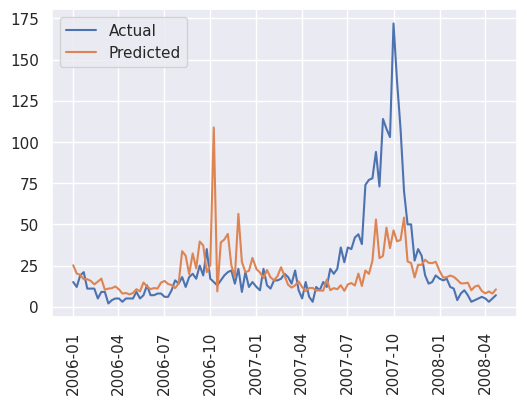

In [106]:
plot_predict(df_test_sj, y_test_sj, y_pred_sj)

## NEGATIVE BINOMIAL REGRESSION MODEL



*  Working with features2keep

Steps

*   Check for dispersion: comparing the variance to the mean of the total cases in both cities in the training data set, we found that there is overdispersion and specifically  the variance is much larger than the mean, the negative binomial approach is better compared witht the poisson regression that fits according to the assumption that the mean and variance of the total cases are equal.
  




In [107]:
df_train['total_cases'].describe()

count    1249.000000
mean       26.007206
std        45.875135
min         0.000000
25%         5.000000
50%        13.000000
75%        29.000000
max       461.000000
Name: total_cases, dtype: float64

In [108]:
df_train[df_train['city']=='iq'][['city',  'total_cases']].describe()


,total_cases
count,440.000000
mean,7.668182
std,11.319501
min,0.000000
25%,1.000000
50%,5.000000
75%,9.000000
max,116.000000


In [109]:
df_train[df_train['city']=='sj'][['city',  'total_cases']].describe()

,total_cases
count,809.000000
mean,35.981459
std,53.834831
min,0.000000
25%,10.000000
50%,21.000000
75%,39.000000
max,461.000000


Overdispersion is observed in both citiies, their respective variances are far larger than the means.

In [110]:
df_train.columns

Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases', 'month'],
      dtype='object')

In [111]:
# columns to drop from variable featured
# If you want to keep all variables just, change columns2drop -- leave 'total_cases' only
colums2drop = ['city', 'weekofyear','year','week_start_date', 'reanalysis_sat_precip_amt_mm', 'reanalysis_specific_humidity_g_per_kg',
               'reanalysis_tdtr_k', 'total_cases', 'l_total_cases']
features2keep = [f for f in df_train.columns if f not in colums2drop]

# def generate_training_test_sets()
X_train_iq = df_train.loc[df_train['city']=='iq',features2keep]
X_train_sj = df_train.loc[df_train['city']=='sj',features2keep]



# Test set
X_test_iq = df_test.loc[df_test['city']=='iq',features2keep]
X_test_sj = df_test.loc[df_test['city']=='sj',features2keep]



# Target - Train
y_train_iq = df_train.loc[df_train['city']=='iq',['total_cases']]['total_cases']
y_train_sj = df_train.loc[df_train['city']=='sj',['total_cases']]['total_cases']



# Target - Test
y_test_iq = df_test.loc[df_test['city']=='iq',['total_cases']]['total_cases']
y_test_sj = df_test.loc[df_test['city']=='sj',['total_cases']]['total_cases']


In [112]:
#Merging the train x,y set  and test x, y set
_train_iq = X_train_iq.join(y_train_iq)
_train_sj = X_train_sj.join(y_train_sj)
_test_iq = X_test_iq.join(y_test_iq)
_test_sj = X_test_sj.join(y_test_sj)

In [113]:
def formula(features2keep):
  concat_strings = ' + '.join(features2keep)
  return (f" total_cases ~ {concat_strings} ")
formula(features2keep)

' total_cases ~ ndvi_ne + ndvi_nw + ndvi_se + ndvi_sw + precipitation_amt_mm + reanalysis_air_temp_k + reanalysis_avg_temp_k + reanalysis_dew_point_temp_k + reanalysis_max_air_temp_k + reanalysis_min_air_temp_k + reanalysis_precip_amt_kg_per_m2 + reanalysis_relative_humidity_percent + station_avg_temp_c + station_diur_temp_rng_c + station_max_temp_c + station_min_temp_c + station_precip_mm + month '

## IQUITOS

best alpha =  1e-08
best score w/o cv =  5.355263157894737
MAE Iquitos: 5.514493564771231


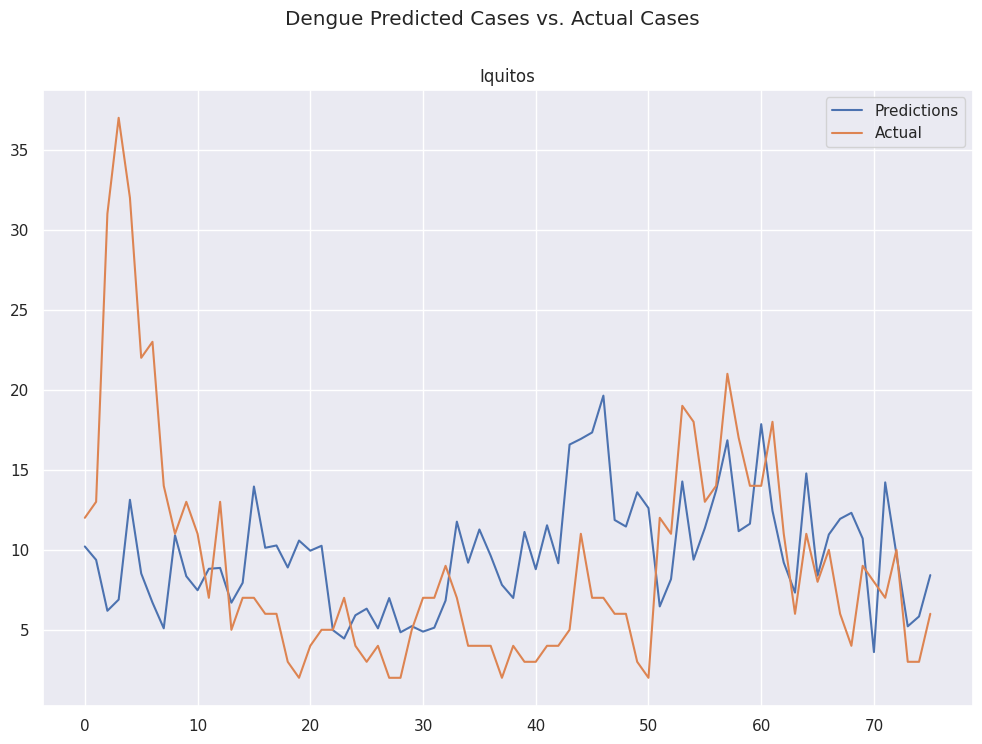

In [117]:
# import necessary libraries
from sklearn.metrics import mean_absolute_error
from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod.families import NegativeBinomial
import statsmodels.api as sm
from statsmodels.tools import eval_measures


CITY = 'Iquitos'

from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod.families import NegativeBinomial
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import glm
from statsmodels.tools import eval_measures
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools import eval_measures
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.model_selection import TimeSeriesSplit, cross_val_score

def get_best_model(train, test):
    # model formula


    model_formula = formula(features2keep)

    grid = 10 ** np.arange(-8, -3, dtype=np.float64)

    best_alpha = []
    best_score = 1000

    #Finding the best hyper parameter, alpha
    for alpha in grid:
        model = smf.glm(formula=model_formula, data=train, family=sm.families.NegativeBinomial(alpha=alpha))

        results = model.fit()
        predictions = results.predict(test).astype(int)
        score = eval_measures.meanabs(predictions, test.total_cases)

        if score < best_score:
            best_alpha = alpha
            best_score = score

    print('best alpha = ', best_alpha)
    print('best score w/o cv = ', best_score)
    return results



iq_best_model = get_best_model(_train_iq, _test_iq) #obtain the best model

#plotting the predicted against actual total cases
figs, axes = plt.subplots(nrows=1, ncols=1,figsize=(12, 8))

iq_pred = iq_best_model.predict(_test_iq) #predict the test set

iq_pred.plot(label= "Predictions")
_test_iq.total_cases.plot(label= "Actual", title= "Iquitos")

plt.suptitle("Dengue Predicted Cases vs. Actual Cases")
plt.legend()


from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(_test_iq["total_cases"], iq_pred)
print("MAE Iquitos:", mean_absolute_error(_test_iq["total_cases"], iq_pred))


In [118]:
#Cross validation with best alpha

class GLMWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, alpha=1.0):
        self.alpha = alpha
        self.model = None
        self.result = None

    def fit(self, X, y):
        self.model = GLM(y, X, family=NegativeBinomial(alpha=self.alpha))
        self.result = self.model.fit()
        return self

    def predict(self, X):
        return self.result.predict(X)

# Using  alpha value from the code (best alpha = 1e-08)
# Preparing  data here as X_train_iq, y_train_iq
tscv = TimeSeriesSplit(n_splits=5)
model = GLMWrapper(alpha=1e-08)  #alpha from your manual tuning
scores = cross_val_score(model, X_train_iq, y_train_iq, cv=tscv)


sd_mae_cv= np.std(scores)
mean_mae_cv = -np.mean(scores)

res_NB_iq = {'algorithm': ['Negative Binomial Regression'],
       'city': ['Iquitos'],
       'MAE CV': [mean_mae_cv],
      'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_NB_iq


{'algorithm': ['Negative Binomial Regression'],
 'city': ['Iquitos'],
 'MAE CV': [1.2312785344926087],
 'MAE SD': [1.3597593411234532],
 'MAE test': [5.514493564771231]}

## SAN JUAN

Modelling and alpha parameter tuning - San Juan

best alpha =  1e-08
best score w/o cv =  18.892561983471076
MAE San Juan: 19.04823336783858


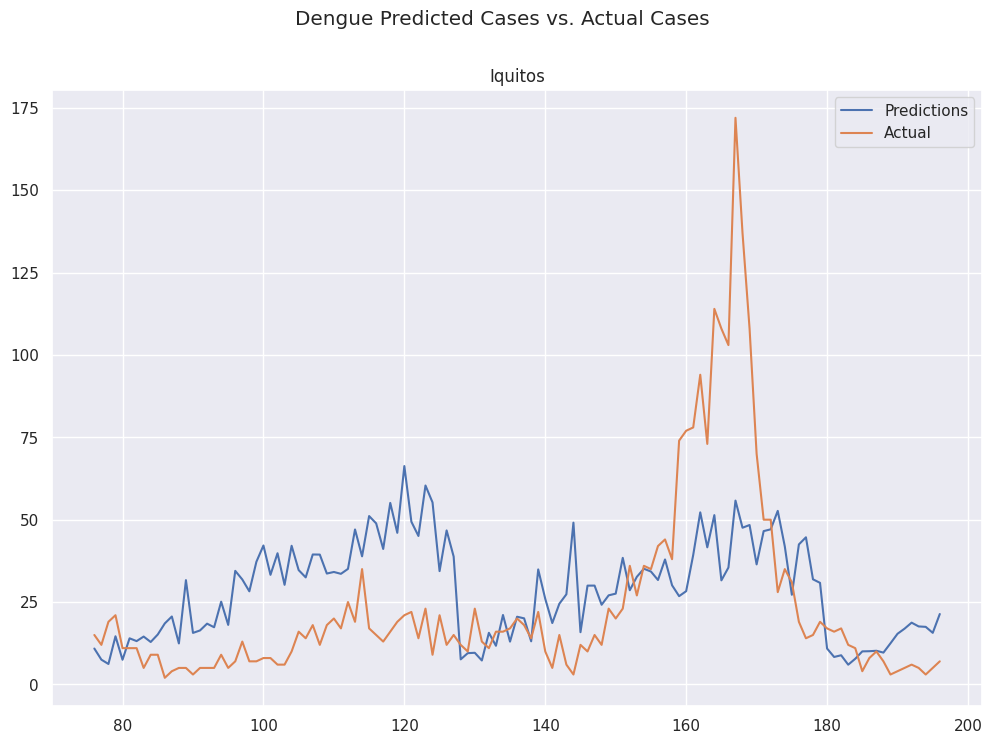

In [119]:
# import necessary libraries
from sklearn.metrics import mean_absolute_error
from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod.families import NegativeBinomial
import statsmodels.api as sm
from statsmodels.tools import eval_measures


CITY = 'San Juan'

from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod.families import NegativeBinomial
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import glm
from statsmodels.tools import eval_measures
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools import eval_measures
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.model_selection import TimeSeriesSplit, cross_val_score



sj_best_model = get_best_model(_train_sj, _test_sj) #obtain the best model

#plotting the predicted against actual total cases
figs, axes = plt.subplots(nrows=1, ncols=1,figsize=(12, 8))

sj_pred = sj_best_model.predict(_test_sj) #predict the test set

sj_pred.plot(label= "Predictions")
_test_sj.total_cases.plot(label= "Actual", title= "Iquitos")

plt.suptitle("Dengue Predicted Cases vs. Actual Cases")
plt.legend()


from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(_test_sj["total_cases"], sj_pred)
print("MAE San Juan:", mean_absolute_error(_test_sj["total_cases"], sj_pred))


Modelling with time series cross validation and best alpha: - San Juan

In [120]:
#Cross validation with best alpha

class GLMWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, alpha=1.0):
        self.alpha = alpha
        self.model = None
        self.result = None

    def fit(self, X, y):
        self.model = GLM(y, X, family=NegativeBinomial(alpha=self.alpha))
        self.result = self.model.fit()
        return self

    def predict(self, X):
        return self.result.predict(X)

# Using  alpha value from the code (best alpha = 1e-08)
# Preparing  data here as X_train_sj, y_train_sj
tscv = TimeSeriesSplit(n_splits=5)
model = GLMWrapper(alpha=1e-08)  #alpha from your manual tuning
scores = cross_val_score(model, X_train_sj, y_train_sj, cv=tscv)


sd_mae_cv= np.std(scores)
mean_mae_cv = -np.mean(scores)

res_NB_sj = {'algorithm': ['Negative Binomial Regression'],
       'city': ['San Juan'],
       'MAE CV': [mean_mae_cv],
      'MAE SD': [sd_mae_cv],
       'MAE test': [mae]
         }
res_NB_sj


{'algorithm': ['Negative Binomial Regression'],
 'city': ['San Juan'],
 'MAE CV': [4.841106911810268],
 'MAE SD': [7.241547900425917],
 'MAE test': [19.04823336783858]}

# Exporting results to Latex

In [123]:
# Combine all results
def merge_res(d1,d2): #Function to merge dictionary
    return {k: [*d1.get(k, []), *d2.get(k, [])] for k in set(d1) | set(d2)}

from functools import reduce
metrics = reduce(merge_res, [res_svr_iq, res_svr_sj, res_xgb_sj, res_xgb_iq, res_poisson_sj, res_poisson_iq, res_rf_sj, res_rf_iq, res_GBT_iq, res_GBT_sj, res_NB_iq, res_NB_sj])

metrics1 = pd.DataFrame(metrics)[['city', 'algorithm','MAE CV', 'MAE SD', 'MAE test']]

metrics1.to_latex()


import os
# Model comparison
try:
    # Create the directory if it doesn't exist
    dest_path = './tables'
    os.makedirs(dest_path, exist_ok=True)

    # Convert DataFrame to LaTeX
    metrix = metrics1.to_latex(float_format='%.3f',index=False)
    print(metrix)
    # Write the LaTeX string to the file
    with open('./tables/metrix.tex', 'w') as f:
        f.write(metrix)
except Exception as e:
    print(e)


\begin{tabular}{llrrr}
\toprule
city & algorithm & MAE CV & MAE SD & MAE test \\
\midrule
Iquitos & SVR & 6.852 & 1.694 & 4.822 \\
San Juan & SVR & 24.256 & 9.928 & 14.295 \\
San Juan & XGboost & 0.016 & 0.066 & 15.288 \\
Iquitos & XGboost & 0.652 & 9.928 & 5.085 \\
San Juan & Poisson & 0.762 & 0.980 & 19.618 \\
Iquitos & Poisson & 2.228 & 3.672 & 5.019 \\
San Juan & Random Forest & 2.577 & 3.680 & 19.156 \\
San Juan & Random Forest & 1.169 & 0.910 & 4.985 \\
Iquitos & GBT & 6.530 & 1.676 & 5.263 \\
San Juan & GBT & 25.035 & 9.664 & 14.816 \\
Iquitos & Negative Binomial Regression & 1.231 & 1.360 & 5.514 \\
San Juan & Negative Binomial Regression & 4.841 & 7.242 & 19.048 \\
\bottomrule
\end{tabular}



In [124]:
metrics1.columns
metrics1[['city', 'algorithm','MAE CV', 'MAE SD', 'MAE test']]

,city,algorithm,MAE CV,MAE SD,MAE test
0,Iquitos,SVR,6.852000,1.694000,4.822000
1,San Juan,SVR,24.256000,9.928000,14.295000
2,San Juan,XGboost,0.016135,0.066111,15.288142
3,Iquitos,XGboost,0.652196,9.928000,5.085306
4,San Juan,Poisson,0.761995,0.979515,19.618276
5,Iquitos,Poisson,2.227643,3.672037,5.018607
6,San Juan,Random Forest,2.577492,3.679801,19.156095
7,San Juan,Random Forest,1.168852,0.910434,4.985070
8,Iquitos,GBT,6.529509,1.676101,5.263414
9,San Juan,GBT,25.035392,9.663961,14.816328
